In [1]:
import math

from pathlib import Path
from pprint import pprint
import importlib

import folium
import geopandas as gpd

import numpy as np
import pandas as pd

from IPython.display import display, Image
from matplotlib.colors import ListedColormap

from pystac_client import Client

from rich.console import Console

from shapely import geometry
from shapely.geometry import Polygon, box
import xarray as xr

from enum import IntEnum

import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm




from rasterio.enums import Resampling


import utils

In [2]:
%pip install -q \
    "dask[distributed]" \
    folium==0.20.0 \
    geopandas==1.1.3 \
    mapclassify==2.10.0 \
    matplotlib==3.10.7 \
    pystac_client==0.9.0 \
    rich==14.3 \
    rioxarray==0.22.0 \
    xarray-eopf==0.2.5

/home/bibo/.zshenv:2: command not found: rbenv
Note: you may need to restart the kernel to use updated packages.


### Introduction & problem statement

Monitor the **vegetation vigor of Panthera onca/Yaguareté corridors across the american continent** region where the native animal was observed along the history,  
by exploring, processing and visualizing **cloud-native EOPF Sentinel Zarr data and STAC metadata**,  
analyzing the "habitat pulse" (NDVI) of over 1,000 observation scenes t

> The methodology focuses on distributed lazy-loading patterns to perform scientific scaling, quality masking (SCL), and spatial clipping directly on cloud-hosted arrays.

- 🐆🆘 [Threatened due to loss and fragmentation, prey depletion, direct hunting ](https://wwf.panda.org/es/que_hacemos/especiesp/jaguar/)

> These texts use:  
> - **Panthera onca** *(scientific name)*,  
> - or **Yaguareté** *(“The true beast” in Guaraní -native american indigenous language-)*,  
> honoring the original name given by native american and local communities.  
> *also known as onça-pintada in Brasil.*

![](https://img-fotki.yandex.ru/get/9361/137106206.3f3/0_db887_c15cb53_orig.jpg)
> 💚 [LiveJournal masterok.livejournal.com. (2018).](https://img-fotki.yandex.ru/get/9361/137106206.3f3/0_db887_c15cb53_orig.jpg)

🤓ℹ️ King of the tropical and subtropical jungles, **the largest feline of America *(the continent)***, and the third largest in the world.

- 🤓ℹ️ Interesting non‑coding fact 
- ℹ️ Coding support information 
- 💡✨ Tips 
- 💚 Acknowledgment and quotes
- 🛠️ Troubleshooting
- 🦥 Lazy operations
- ✍🏽 Obs & assumptions 

### **Objective**
Establish a cloud-native monitoring set of jupyter notebooks for Panthera onca corridors using the EOPF Sentinel Zarr Samples Service.   

> *ℹ️ disclaimer: While global EOPF Zarr data is available for exploratory purposes,  
> the catalog typically maintains a rolling archive of ~1 month relative to "now".  
> Historical analysis for South American corridors may require extra data requests.*

### Pre-requisites

**Python fundamentals *ONLY* .** The project includes:

- **🔍 Concepts Explained**: Every cloud-native concept *(EOPF products, Zarr format, scientific/math tasks, decision)* is explained before the first line of code.  
- **📂 -python- Objects Explored**: By printing types, metadata, inspecting internal data hierarchies, etc.
- **🚀 Visual and hands-on learning****: At Jupyter notebook cell level, live responses, interactive maps, prints and outputs checks.

#### Part 1: Data discovery and harmonization for Panthera onca habitat monitoring

The notebook performs **data discovery and harmonization** for sentinel earth observation products using the EOPF STAC and Zarr ecosystem.

Scope:

- **Define the Area of interest *(AOI)***:
    - Map the Yaguareté distribution combining Natural Earth vector data and manual search by bounding box.
- **Lazy Discovery**:
    - Query Sentinel collections via STAC API client to get as many items as possible for habitat intersection
- **Structural Inspection**:
    - Use the eopf-zarr engine to navigate and understand what data exists and how it is structured*.
- **Harmonization**:
    - Prepare a GeoDataFrame with the multi-mission data for further processing and calculation.
- **Map-first exploration and early observation**:
    - On-the-fly interactive maps for visual exploration and early decision-making.

No data is read/compute at this stage. Only metadata queries are performed.

#### What we will learn

* 🚀 **Cloud-Native Discovery**: Searching the EOPF STAC API to find spatiotemporal assets without downloading files.  
    - combining a public dataset with sptial custom STAC API query.  
* 🔎 **Multi-Mission Integration**: Harmonizing Sentinel-2 L2A (for vegetation vigor) and L1C (for structural validation) into a single analytical frame.  
* 🦥 **Lazy Data Access**: Using the eopf-zarr engine to inspect product structures and metadata before processing.  
* 🧐 **Early, on-the-fly interactive map visualization**: still lazy operations, useful for validation and learning.  

##### Data approach: 

- 🌿 **Ecological relevance**: variables directly linked to habitat quality (vegetation).
- 📡 **Cloud-native suitability**: datasets that benefit from chunked, streaming access.
- **Temporal dynamics**: support for time-series monitoring under rolling archive constraints.
- **Operational scalability**: workflows that can be re-run as new data arrives.

#### Selected Core Datasets

| Dataset | Purpose | Why |
|----------|----------|----------------------|
| [Sentinel-2 L2A](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-2-l2a?.language=en) | Vegetation indices (NDVI, NBR) | Time-chunked optical data, partial band reads |
| [Sentinel-2 Level-1C](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-2-l1c?.language=en) | Visual habitat inspection | High-resolution multi-spectral data, ideal for structural validation of corridors |

#### Environment Setup

##### Workdir

##### Dependencies requirements

- [xarray-eopf](https://eopf-sample-service.github.io/xarray-eopf/start/): Provides the EOPF backend for opening and navigating Sentinel Zarr products with xarray.

The following libraries extend visualization and geospatial support, enabling interactive map rendering and geoprocessing capabilities:

- [folium](https://python-visualization.github.io/folium/): Leaflet-based interactive web mapping.  
- [geopandas](https://geopandas.org/): Adds spatial data structures and operations for pandas-style geodata analysis.  
- [mapclassify](https://pysal.org/mapclassify/): Implements data classification schemes (e.g., quantiles, natural breaks).  
- [matplotlib](https://matplotlib.org/stable/): Colormaps and basic plotting support for geospatial visualizations.

Additional dependencies for scalable processing, data management, and diagnostics:

- [dask\[distributed\]](https://docs.dask.org/en/stable/): Enables parallel and distributed computing across large datasets.  
- [pystac_client](https://pystac-client.readthedocs.io/): Facilitates discovery and access to SpatioTemporal Asset Catalog (STAC) APIs.  
- [rioxarray](https://corteva.github.io/rioxarray/stable/): Integrates raster input/output and coordinate reference system management with xarray.  
- [rich](https://rich.readthedocs.io/): Enhances console output with formatting, progress bars, and syntax highlighting.


> 💡 Automatically collapse all outputs   
> `collapse_outputs()`  
> *NOTE*: helper functions needed accross the notebook are being written dynamically at `./utils.py`

In [3]:
%%writefile utils.py
import folium

from IPython import get_ipython
from IPython.display import Javascript, display, Image

def collapse_outputs(*_args: any, **_kwargs: any) -> None:
    """
    Collapse outputs of all code cells in the current JupyterLab notebook.

    This helper is registered as a post-run hook so that, after each cell
    execution, all code cell outputs are collapsed. It helps keep long
    notebooks compact and easier to navigate.
    """

    display(
        Javascript(
            """
            document
              .querySelectorAll('.jp-CodeCell')
              .forEach(cell => {
                const btn = cell.querySelector('.jp-OutputCollapser');
                if (btn) { btn.click(); }
              });
            """
        )
    )


    ipython = get_ipython()
    if ipython is not None:
        ipython.events.register("post_run_cell", collapse_outputs)

Overwriting utils.py


In [4]:
utils.collapse_outputs()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Coordinate Reference System (CRS)

- All geometries and STAC queries use **EPSG:4326 (WGS84)**, which is the standard geographic CRS used by STAC APIs for spatial queries.  
- Coordinates are expressed as longitude and latitude in degrees.
- Sentinel-2 products themselves are stored in UTM/MGRS native grids.  
> Reprojection may be required later when combining tiles across zones.

> NOTE: constants are defined after the correspondant exploring and explanation instead of all at the beginning of the notebook, making easier the learning process.

In [5]:
CRS_FOR_UNPROJ_LAT_LON: str = "EPSG:4326"

<IPython.core.display.Javascript object>

> used for all STAC spatial queries and GeoDataFrames

## Panthera onca habitat Data

- The habitat polygons represent the known distribution of *Panthera onca*.

### 💚 Data Source Acknowledgment

This notebook uses vector and base map data from **Natural Earth** (version 5.1.2, accessed 2026‑02‑11).  
Natural Earth is a public‑domain global geospatial dataset developed by NACIS and volunteer contributors.

```bibtex
@misc{naturalearth,
  author = {Natural Earth},
  title = {Natural Earth Map Data},
  year = {2025},
  url = {https://www.naturalearthdata.com},
  note = {Public domain dataset, version 5.1.2, accessed 2026‑02‑11}
}

More info and downloads: https://www.naturalearthdata.com

In [6]:
DATASETS_PATH = Path("datasets")

<IPython.core.display.Javascript object>

In [7]:
shp_panthera_onca_path = DATASETS_PATH / "readlist_species_data/data_0.shp"

panthera_onca_gdf = gpd.read_file(shp_panthera_onca_path, engine="pyogrio")

<IPython.core.display.Javascript object>

In [8]:
panthera_onca_gdf.head(3)

,ASSESSMENT,ID_NO,SCI_NAME,PRESENCE,ORIGIN,SEASONAL,COMPILER,YRCOMPILED,CITATION,LEGEND,SUBSPECIES,SUBPOP,DIST_COMM,ISLAND,TAX_COMM,geometry
0,123791436.0,15953.0,Panthera onca,1,1,1,Panthera,2017,Panthera,Extant (resident),None,None,None,None,None,"POLYGON ((-108.7213 26.94596, -108.64985 26.91..."
1,123791436.0,15953.0,Panthera onca,1,1,1,Panthera,2017,Panthera,Extant (resident),None,None,None,None,None,"POLYGON ((-99.13257 21.13408, -99.15527 21.125..."
2,123791436.0,15953.0,Panthera onca,1,1,1,Panthera,2017,Panthera,Extant (resident),None,None,None,None,None,"MULTIPOLYGON (((-99.00781 23.49911, -99.06135 ..."


<IPython.core.display.Javascript object>

> ℹ️ Only geometry *(POLYGON objects)* is the column of interest for now

### 💡 Geometry Simplification

Huge geometries are simplified using a tolerance suited for continental-scale analysis.

> The `simplify` method uses the Douglas-Peucker algorithm to recursively remove vertices from the polygon boundaries, it connects endpoints with a straight line, and removes any points whose distance to that line is smaller than the specified `tolerance`.

- This reduces geometric complexity without affecting regional-scale interpretations.  
- Simplification is applied only for discovery and visualization.
- For an area as vast as the South American continent, `GEOMETRY_TOL = 1`:
    - 1 degree or ≈100 km at this latitude simplification is considered "more than acceptable" for exploratory discovery.
> 🛠️ It prevents the `ProgramLimitExceededError` and browser crashes that occur when trying to handle millions of vertices in an interactive `explore()` map.

In [9]:
GEOMETRY_TOL: int = 1

<IPython.core.display.Javascript object>

In [10]:
panthera_onca_gdf_only_geometry = gpd.GeoDataFrame(
    panthera_onca_gdf[["geometry"]], 
    geometry="geometry",
    crs=panthera_onca_gdf.crs,
)

panthera_onca_gdf_simple = panthera_onca_gdf_only_geometry.to_crs(CRS_FOR_UNPROJ_LAT_LON).copy()

<IPython.core.display.Javascript object>

### 💡 Check for Invalid Geometries 

>  🛠️ Prevent/Fix `GEOSException: TopologyException: side location conflict at <lat>,<lon>`. This can occur if the input geometry is invalid.

In [11]:
invalid_geometry = ~panthera_onca_gdf_simple.is_valid
panthera_onca_gdf_simple[invalid_geometry]

,geometry


<IPython.core.display.Javascript object>

In [12]:
%%writefile -a utils.py

import geopandas as gpd
from shapely.validation import make_valid


def fix_invalid_geometries(gdf: gpd.GeoDataFrame) -> gpd.GeoDataFrame:
    """
    Fix invalid geometries in a GeoDataFrame using ``shapely.make_valid``.

    Checks the validity of each geometry in the input
    GeoDataFrame and applies ``make_valid``
    It returns a copy of the GeoDataFrame with corrected geometries.

    Args:
    gdf : geopandas.GeoDataFrame
        GeoDataFrame whose geometry column may contain invalid geometries.

    Returns:
    geopandas.GeoDataFrame
        A new GeoDataFrame where invalid geometries have been repaired.
    """
    gdf_fixed = gdf.copy()

    invalid_mask = ~gdf_fixed.geometry.is_valid

    if invalid_mask.any():
        gdf_fixed.loc[invalid_mask, "geometry"] = (
            gdf_fixed.loc[invalid_mask, "geometry"].apply(make_valid)
        )

    return gdf_fixed

Appending to utils.py


<IPython.core.display.Javascript object>

In [13]:
importlib.reload(utils)

panthera_onca_gdf_simple["geometry"] = panthera_onca_gdf_simple.geometry.simplify(
    tolerance=GEOMETRY_TOL, preserve_topology=True
)

panthera_onca_gdf_simple = utils.fix_invalid_geometries(panthera_onca_gdf_simple)

<IPython.core.display.Javascript object>

In [14]:
panthera_onca_gdf_simple.to_file("datasets/panthera_onca_gdf_simple.geojson", driver="GeoJSON")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> load later: `panthera_onca_gdf_simple = gpd.read_file("datasets/panthera_onca_gdf_only_geometry.geojson")`

### On-the-fly interactive map

💡 Generate an interactive leaflet map based on :class:`~geopandas.GeoDataFrame`, by explore() method  
[More info](https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html)

In [15]:
m = panthera_onca_gdf_simple.explore(
    color="orange",
    tooltip=False,
    legend=True,
)

m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> on-the-fly map for observing the full panthera onca habitat in the american continent  
> ✨ Zoom/pan the map to get a sense of the corridor extent

![](img/panthera_onca_gdf_simple_explore.png)
> *map output redundancy in case is not being showed/rendered correctly*

> ✨ Note that the geometry of interest does not need extra steps like landscape detection, but it could include elements like rivers where the `NDVI` pixel values has no physical sense.

> This is a public and updated yaguareté habitat geometry. However, this animal once inhabited almost the entire American continent.

<div style="display:flex; gap:20px; flex-wrap:wrap; align-items:flex-start;">

<div>
<b>Ritual yaguareté-skin costume</b> (Pilagá, Argentine Gran Chaco), <i>SouthAmerica</i><br>
<a href="https://id.smb.museum/object/179410/felljacke">
  <img src="https://recherche.smb.museum/images/29/2987268_300x300.jpg" width="150">
</a>
</div>

<div>
<b>Yaguareté skin hat or headdress</b> (Argentine–Bolivian Gran Chaco), <i>SouthAmerica</i><br>
<a href="https://www.kringla.nu/kringla/objekt?referens=SMVK-EM%2Fobjekt%2F1037943">
  <img src="https://collections.smvk.se/carlotta-em/web/image/zoom/1129424/1913.21.0186.jpg" width="150">
</a>
</div>

<div>
<b>Yaguareté skin bag</b> (French Guiana), <i>SouthAmerica</i><br>
<a href="https://www.kringla.nu/kringla/objekt?referens=SMVK-EM%2Fobjekt%2F1278668">
  <img src="https://collections.smvk.se/carlotta-em/web/image/zoom/1278670/1906.36.0293_alt.jpg" width="150">
</a>
</div>

<div>
<b>Necklace made from yaguareté teeth</b> (probably from Bekisde, Costa Rica), <i>CentralAmerica</i><br>
<a href="https://www.kringla.nu/kringla/objekt?referens=SMVK-EM%2Fobjekt%2F1015550">
  <img src="https://collections.smvk.se/carlotta-em/web/image/zoom/2058390/image.jpg" width="150">
</a>
</div>

</div>

Ceremonial headdress made from jaguar skin, acquired in **1913** by the Swedish National Museums of World Culture.

> **🐆 Ancient echoes:**
> The Yaguareté (Panthera onca) is far more than a big cat,
> it is a foundational pillar of American cosmogonies. Since the "old times," indigenous communities have revered the yaguarete as a **profound spiritual entity**, a belief immortalized in sacred stone, metal, and ceramic artifacts now held in global collections from Berlin to Sweden, away from home...
> 
The Shamanic Path: Ancestral wisdom links the jaguar to the sacred cebil plant (Anadenanthera colubrina), used by shamans to transform into felines and navigate the supernatural realm.
Forces of Nature: Its power is inextricably tied to the land’s fertility, the success of agricultural cycles, and the atmospheric roar of Lightning and Thunder.
(Citations: Gordillo 2010; González 1977, 1983, 1998, 2010; Reichel-Dolmatoff 1978)

> gratitude to [Agustina Ponce](https://bicyt.conicet.gov.ar/fichas/p/natalia-agustina-ponce), an Argentinian archaeologist, who is always vigilant in helping me better understand my identity. Her perspective reminds us that we are not just monitoring a species, but a sacred symbol of our soil.

In [16]:
panthera_onca_projected_equal_area = panthera_onca_gdf_simple.to_crs("ESRI:54009") 
panthera_onca_projected_equal_area["area_m2"] = panthera_onca_projected_equal_area.geometry.area

panthera_onca_projected_equal_area["area_km2"] = (
    panthera_onca_projected_equal_area["area_m2"] / 1_000_000
)

total_panthera_onca_area = panthera_onca_projected_equal_area["area_km2"].sum()
print(total_panthera_onca_area)

8845488.832111698


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- Panthera onca habitat area: 8,962,221 km²

> 🤓ℹ️ Fun fact: the total area where our animal of interest lives represents +80% of all Europe *([total europe area: ~10,180,000 km²](https://en.wikipedia.org/wiki/Europe)*)

In [17]:
invalid_geometry = ~panthera_onca_gdf_simple.is_valid
panthera_onca_gdf_simple[invalid_geometry]

,geometry


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [18]:
panthera_onca_gdf_simple = utils.fix_invalid_geometries(panthera_onca_gdf_simple)

invalid_geometry = ~panthera_onca_gdf_simple.is_valid

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [19]:
unified_panthera_onca_geometry = panthera_onca_gdf_simple.geometry.union_all()
search_panthera_onca_geometry = geometry.mapping(
    unified_panthera_onca_geometry
)

GEOMETRY_OI = search_panthera_onca_geometry

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### STAC Catalog

- The EOPF STAC catalog browser is used for discovery (https://stac.browser.user.eopf.eodc.eu/) as follows:

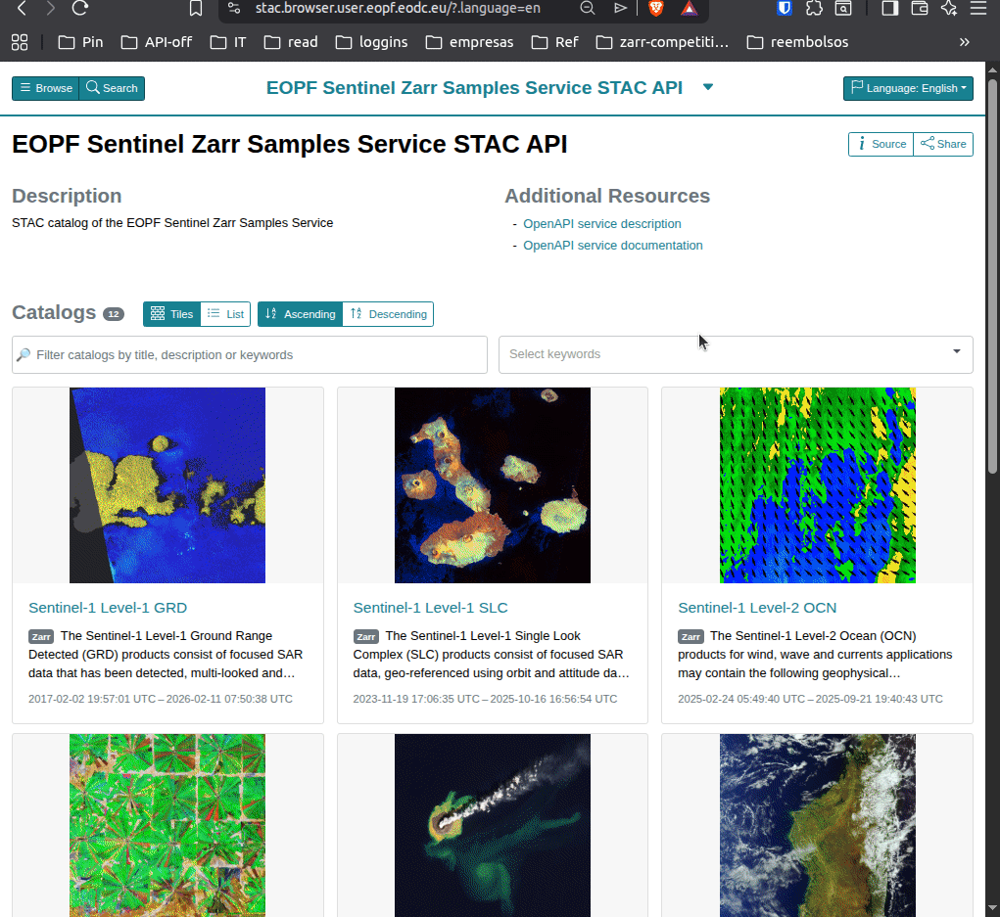

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
display(Image(filename="./img/stac_browser_discovery.gif"))

### ℹ️ Area of Interest (AOI)

A bounding box is defined to ensure intersection with yaguareté habitat areas.

- The AOI is intentionally large due to limited data availability in the region.
    - 💡 the `BBOX` coordinates were extracted from approx STAC catalog browser after manually defining the area *(see the gif)*   
- Spatial filtering is refined later using habitat geometries.

In [21]:
BBOX_OI = min_lon, min_lat, max_lon, max_lat = (
    -115.48023291384756,
    -28.550757842802206,
    -34.089573019530036,
    30.513348411461777
)

box_oi = box(*BBOX_OI)

polygon_oi = gpd.GeoDataFrame(
    index=[0], 
    crs=CRS_FOR_UNPROJ_LAT_LON, 
    geometry=[box_oi],
    
)

polygon_oi

,geometry
0,"POLYGON ((-34.08957 -28.55076, -34.08957 30.51..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [22]:
polygon_oi_simple = polygon_oi.to_crs(CRS_FOR_UNPROJ_LAT_LON).copy()

polygon_oi_simple["geometry"] = polygon_oi_simple.geometry.simplify(
    tolerance=GEOMETRY_TOL, preserve_topology=True
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [23]:
polygon_oi_simple.explore(
    m=m,
    color="deepskyblue",
    style_kwds={"fillOpacity": 0.07, "weight": 2},
    tooltip=True,
)

m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [24]:
STAC_CATALOG_URL = "https://stac.core.eopf.eodc.eu/"

COLLECTIONS_OI = [
    "sentinel-2-l2a",
]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [25]:
client = Client.open(STAC_CATALOG_URL)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [26]:
catalog = client.get_collection(COLLECTIONS_OI[0])
catalog

<CollectionClient id=sentinel-2-l2a>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [27]:
catalog.id, catalog.description

('sentinel-2-l2a',
 'The Sentinel-2 Level-2A Collection 1 product provides orthorectified Surface Reflectance (Bottom-Of-Atmosphere: BOA), with sub-pixel multispectral and multitemporal registration accuracy. Scene Classification (including Clouds and Cloud Shadows), AOT (Aerosol Optical Thickness) and WV (Water Vapour) maps are included in the product.')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Collection Selection

- 📡 [**Level-2A**](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-2-l2a) provides Bottom-Of-Atmosphere (BOA) reflectance.  
    - These products are atmospherically corrected and suitable for vegetation indices.
- 📡 [**Level-1C**](https://stac.browser.user.eopf.eodc.eu/collections/sentinel-2-l1c) provides Top-Of-Atmosphere reflectance and requires additional correction.  
    - It is inspected but not mixed in time-series analysis.
 
### Temporal Range

The temporal search window spans:

`2024–2026`

- This broad window results from early STAC browser exploration and supports exploratory discovery.  
- Later stages may use monthly or seasonal aggregation.


In [28]:
YEAR_OF_OLDEST_ITEM, CURRENT_YEAR = 2024, 2026 

time_range_str = "/".join([str(YEAR_OF_OLDEST_ITEM), str(CURRENT_YEAR)])

print(f"Time range to search: {time_range_str}")

Time range to search: 2024/2026


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Sentinel-2 MSI Sensor

ℹ️ Sentinel-2 uses the MultiSpectral Instrument (MSI):

- 13 spectral bands  
- push-broom imaging  
- ~290 km swath  
- visible, NIR, SWIR coverage

Level-2A reflectance values represent surface reflectance after atmospheric correction.

> [More info](https://www.earthdata.nasa.gov/data/instruments/sentinel-2-msi)

### Key Spectral Bands

**B04 (Red, ~665 nm)**  
 🌿 Sensitive to chlorophyll absorption.

**B08 (NIR, ~842 nm)**  
 🌿Strongly reflected by healthy vegetation.

The red–NIR contrast enables vegetation indices such as NDVI.


### 🦥 Lazy STAC Searches

Initial searches are performed lazily.

![](https://wwfint.awsassets.panda.org/img/jaguar_59840_360415.jpg)
> © WWF / Michel GUNTHER  
> 🤓ℹ️ [Yaguarete rests around 12 hours per day in the wild.](https://link.springer.com/article/10.1007/s13364-021-00589-0?utm_source=chatgpt.com)


This means:

- Only metadata is fetched
- No pixel data is downloaded
- Results are streamed page-by-page

Lazy discovery allows EARLY exploration of large archives.

#### ✨ protip: `intersects` queries

Querying a continental-scale bounding box can exceed API limits.

Using `intersects` with the habitat geometry:

- Reduces unnecessary item retrieval
- Focuses only on relevant scenes
- Avoids STAC `ProgramLimitExceeded` errors

In [29]:
lazy_early_search = client.search(
    collections=COLLECTIONS_OI,
    intersects=GEOMETRY_OI,
    datetime=time_range_str,
    max_items=3
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [30]:
type(lazy_early_search)

pystac_client.item_search.ItemSearch

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
items_gen = lazy_early_search.items()
items_gen

<generator object ItemSearch.items at 0x7fad4c805a80>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
early_item = next(items_gen, None)
early_item

<Item id=S2B_MSIL2A_20250719T135709_N0511_R067_T21KWV_20250719T192500>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

⚠️ Not lazy anymore:
> - Converting to a list: `list(search.items())`  
> - Looping through all items  

In [33]:
early_items = [item for item in items_gen]
early_items

[<Item id=S2A_MSIL2A_20250519T174731_N0511_R098_T13RCK_20250519T211718>,
 <Item id=S2A_MSIL2A_20250519T174731_N0511_R098_T13RCJ_20250519T211718>]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [34]:
early_item = early_items[0]
early_item

<Item id=S2A_MSIL2A_20250519T174731_N0511_R098_T13RCK_20250519T211718>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [35]:
pprint(early_item.geometry)

{'coordinates': [[[-105.90460702316327, 26.425980982109515],
                  [-105.92056814397928, 26.367755127153085],
                  [-105.96114309335171, 26.220034677837976],
                  [-105.98578671394606, 26.127412313615427],
                  [-107.00018635151518, 26.117197498081712],
                  [-107.01750565519728, 27.107979523970712],
                  [-105.91007663635668, 27.11952122632138],
                  [-105.90460702316327, 26.425980982109515]]],
 'type': 'Polygon'}


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> 💡 reset `m` map helper reducing noise and overload the jupyter/browser by adding layers and elements

In [36]:
%%writefile -a utils.py

import geopandas as gpd
import folium 

def reset_panthera_onca_map(
    panthera_onca_gdf_simple: gpd.GeoDataFrame,
    opacity: float = 0.6,
    explore_kwargs: dict | None = None,
) -> folium.Map:
    """
    Create a fresh interactive map of the Panthera onca habitat.
    
    Args:
        panthera_onca_gdf_simple: gpd.GeoDataFrame
            Simplified habitat GeoDataFrame
        opacity: float, default 0.6
            Habitat layer opacity
        explore_kwargs: dict, optional
            Additional kwargs passed directly to gpd.explore()
    
    Returns:
        folium.Map with panthera onca geometry
    """
    default_kwargs = {
        "color": "orange",
        "tooltip": False,
        "legend": True,
        "style_kwds": {
            "fillOpacity": opacity,
            "opacity": opacity,
        },
    }
    
    if explore_kwargs:
        explore_kwargs["style_kwds"] = explore_kwargs.get("style_kwds", {})
        explore_kwargs["style_kwds"].update({
            "fillOpacity": opacity,
            "opacity": opacity,
        })
        default_kwargs.update(explore_kwargs)
    
    return panthera_onca_gdf_simple.explore(**default_kwargs)

Appending to utils.py


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [37]:
importlib.reload(utils)

m = utils.reset_panthera_onca_map(panthera_onca_gdf_simple)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [38]:
early_item_coordinates = early_item.geometry["coordinates"][0]
early_item_polygon = Polygon(early_item_coordinates)

early_item_gdf = gpd.GeoDataFrame(
    index=[0],
    crs=CRS_FOR_UNPROJ_LAT_LON,
    geometry=[early_item_polygon]
)

early_item_gdf.explore(
    m=m,
    color="green",
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> on-the-fly map with items sample for observing footprint  
> *NOTE*: The coverage scene item intersects partially with the geometry of interest, clipping will be needed further.

![](img/early_item_explore.png)
> *map output redundancy in case is not being showed/rendered correctly*

### ℹ️ EOPF Zarr Asset Registry

To explore these assets effectively, the eopf-zarr engine is required when using `xr.open_datatree` or `xr.open_dataset`, as it allows Xarray to navigate the hierarchical internal structure (e.g., measurements/reflectance/r10m) of the product.

In [39]:
early_item.assets.keys()

dict_keys(['SR_10m', 'SR_20m', 'SR_60m', 'AOT_10m', 'B01_20m', 'B02_10m', 'B03_10m', 'B04_10m', 'B05_20m', 'B06_20m', 'B07_20m', 'B08_10m', 'B09_60m', 'B11_20m', 'B12_20m', 'B8A_20m', 'SCL_20m', 'TCI_10m', 'WVP_10m', 'product', 'product_metadata'])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [40]:
early_item

<Item id=S2A_MSIL2A_20250519T174731_N0511_R098_T13RCK_20250519T211718>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [41]:
early_item.assets["product"].href

'https://objectstore.eodc.eu:2222/e05ab01a9d56408d82ac32d69a5aae2a:202505-s02msil2a/19/products/cpm_v256/S2A_MSIL2A_20250519T174731_N0511_R098_T13RCK_20250519T211718.zarr'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [42]:
early_item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]

{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode': 'native'}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Check for `eopf-zarr` engine

In [43]:
xr.backends.list_engines()

{'scipy': <ScipyBackendEntrypoint>
   Open netCDF files (.nc, .cdf and .nc.gz) using scipy in Xarray
   Learn more at https://docs.xarray.dev/en/stable/generated/xarray.backends.ScipyBackendEntrypoint.html,
 'eopf-zarr': <EopfBackend>,
 'rasterio': <RasterioBackend>,
 'store': <StoreBackendEntrypoint>
   Open AbstractDataStore instances in Xarray
   Learn more at https://docs.xarray.dev/en/stable/generated/xarray.backends.StoreBackendEntrypoint.html,
 'zarr': <ZarrBackendEntrypoint>
   Open zarr files (.zarr) using zarr in Xarray
   Learn more at https://docs.xarray.dev/en/stable/generated/xarray.backends.ZarrBackendEntrypoint.html}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Zarr and Xarray DataTree

EOPF products are stored in Zarr format.

Benefits:

- Chunked cloud-native storage
- Partial reads
- Parallel processing
- Hierarchical organization

> 🦥 DataTree allows inspect product structure without loading arrays.

In [44]:
%%time

open_kwargs_from_item = early_item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]

early_datatree = xr.open_datatree(
    early_item.assets["product"].href,
    **open_kwargs_from_item,
)

early_datatree

CPU times: user 376 ms, sys: 12.2 ms, total: 388 ms
Wall time: 5.28 s


<xarray.DataTree>
Group: /
│   Attributes: (2)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 6)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
│   │         * y                              (y) int64 184B 3000000 2995000 ... 2890000
│   │         * x                              (x) int64 184B 300000 305000 ... 410000
│   │         * detector                       (detector) int64 48B 7 8 9 10 11 12
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 660kB dask.array<chunksize=(7, 3, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * y        (y) int64 88kB 2999995 2999985 2999975 ... 2890225 2890215 2890205
│   │   │   │         * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * y        (y) int64 44kB 2999990 2999970 2999950 ... 2890250 2890230 2890210
│   │   │   │         * x        (x) int64 44kB 300010 300030 300050 300070 ... 409750 409770 409790
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(915, 915), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * y        (y) int64 15kB 2999970 2999910 2999850 ... 2890350 2890290 2890230
│   │   │             * x        (x) int64 15kB 300030 300090 300150 300210 ... 409650 409710 409770
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(305, 305), meta=np.ndarray>
│   │   ├── Group: /conditions/mask/l1c_classification
│   │   │   └── Group: /conditions/mask/l1c_classification/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           C

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
list(early_datatree.groups)

['/',
 '/conditions',
 '/measurements',
 '/quality',
 '/conditions/geometry',
 '/conditions/mask',
 '/conditions/meteorology',
 '/measurements/reflectance',
 '/quality/atmosphere',
 '/quality/l2a_quicklook',
 '/quality/mask',
 '/quality/probability',
 '/conditions/mask/detector_footprint',
 '/conditions/mask/l1c_classification',
 '/conditions/mask/l2a_classification',
 '/conditions/meteorology/cams',
 '/conditions/meteorology/ecmwf',
 '/measurements/reflectance/r10m',
 '/measurements/reflectance/r20m',
 '/measurements/reflectance/r60m',
 '/quality/atmosphere/r10m',
 '/quality/atmosphere/r20m',
 '/quality/atmosphere/r60m',
 '/quality/l2a_quicklook/r10m',
 '/quality/l2a_quicklook/r20m',
 '/quality/l2a_quicklook/r60m',
 '/quality/mask/r10m',
 '/quality/mask/r20m',
 '/quality/mask/r60m',
 '/quality/probability/r20m',
 '/conditions/mask/detector_footprint/r10m',
 '/conditions/mask/detector_footprint/r20m',
 '/conditions/mask/detector_footprint/r60m',
 '/conditions/mask/l1c_classification/r6

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ℹ️ Main groups/dirs for EOPF zarr 

```bash
/conditions
/measurements
/quality
```

In [46]:
early_datatree["/measurements/reflectance/r10m"]

<xarray.DataTree 'r10m'>
Group: /measurements/reflectance/r10m
    Dimensions:  (y: 10980, x: 10980)
    Coordinates:
      * y        (y) int64 88kB 2999995 2999985 2999975 ... 2890225 2890215 2890205
      * x        (x) int64 88kB 300005 300015 300025 300035 ... 409775 409785 409795
    Data variables:
        b02      (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
        b03      (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
        b04      (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
        b08      (y, x) float64 964MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Note chunksize for the bands of interests:
```
b04
(y, x)
float64
dask.array<chunksize=(915, 915), meta=np.ndarray>


b08
(y, x)
float64
dask.array<chunksize=(915, 915), meta=np.ndarray>
``` 


In [47]:
EOPF_PRODUCT_CHUNK_SIZE = {'y': 915, 'x': 915}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### ℹ️ Zarr Version Note

Zarr URLs sometimes indicate format versions.

- Zarr V2 (Legacy): Look for `cpm_v256` or lower in the URL
- Zarr V3 / Optimized: Look for `cpm_v260` or higher in
the URL

This matters for large-scale processing efficiency.


### The internal structure of EOPF Zarr products is highly nested to facilitate multi-resolution data storage. Navigating this manually can be complex.
> 💡 These helpers provide a "map" of the Datatree.
- Note on Metadata Depth: Zarr embeds metadata at every level (root, group, and array). 
- This function explicitly surfaces Attributes (🟧) and DataArrays (🟦) to ensure full visibility into the product's self-describing structure.
- lazy: These functions only interact with the Datatree metadata (.attrs, .children, and .data_vars). No binary pixel data is transferred, making this an extremely lightweight discovery tool.

|         Asset Key         |                                 Description                                |                               Resolution / Scientific Utility                              |
|:-------------------------:|:--------------------------------------------------------------------------:|:------------------------------------------------------------------------------------------:|
| product                   | Zarr Store Root: The primary entry point for the cloud-native product.     | Used with the eopf-zarr engine to stream data from object storage.                         |
| B02_10m, B03_10m, B04_10m | Visible Bands: Blue, Green, and Red spectral bands.                        | Used for creating True Color Images (TCI) and calculating NDVI.                            |
| B08_10m                   | Near-Infrared (NIR): Specifically the broad NIR band.                      | Essential for vegetation vigor monitoring (NDVI).                                          |
| SCL_20m                   | Scene Classification Layer: A pixel-based quality mask.                    | Categorizes pixels (e.g., Class 4=Vegetation, 8=Cloud, 3=Shadow) to filter out "bad" data. |

In [48]:
%%writefile -a utils.py

import xarray as xr
from rich.console import Console
from rich.tree import Tree

console = Console()

def emoji_legend_tree():
    legend = Tree("📖 Emoji Legend")
    legend.add("📂 Root / Container")
    legend.add("🟩 Group[ (Internal Zarr hierarchy)")
    legend.add("🟦 DataArray (The actual pixel data)")
    legend.add("🟧 Metadata (Attributes/STAC tags)")
    console.print(legend)


def rich_dtree_recursive(
    node: xr.DataTree, 
    name: str = "root", 
    highlight_paths: list[str] | None = None, 
    parent_path: str = "", 
    highlight_emoji: str = "⭐"):
    """
    Recursively build a Rich Tree of a hierarchical dataset.

    Args:
        node: The current node object with `children`, `ds.data_vars`, and `attrs`.
        name: Name of the current node.
        highlight_paths: List of full paths to highlight.
        parent_path: Path of the parent node.
        highlight_emoji: Emoji to indicate highlighted nodes.

    Returns:
        rich.tree.Tree object representing this node and its children.
    """
    if highlight_paths is None:
        highlight_paths = []

    full_path = f"{parent_path}/{name}" if parent_path else name

    base_emoji = "📂" if parent_path == "" else "🟩"

    is_highlighted = any(p.startswith(full_path) for p in highlight_paths)
    is_root = parent_path == ""

    emoji = f"{base_emoji}{highlight_emoji}" if is_highlighted else base_emoji

    label = f"{emoji} {name} (groups: {len(node.children)}, variables: {len(node.ds.data_vars)}, attrs: {len(node.attrs)})"
    tree = Tree(label)

    if is_root or is_highlighted:
        for metadata in node.attrs:
            tree.add(f"🟧 {metadata}")
        for array in node.ds.data_vars:
            tree.add(f"🟦 {array}")

    highlighted_children = {}
    normal_children = {}
    for child_name, child_node in node.children.items():
        child_full_path = f"{full_path}/{child_name}"
        if any(p.startswith(child_full_path) for p in highlight_paths):
            highlighted_children[child_name] = child_node
        else:
            normal_children[child_name] = child_node

    for child_name, child_node in highlighted_children.items():
        tree.add(
            rich_dtree_recursive(
                child_node,
                child_name,
                highlight_paths,
                parent_path=full_path,
                highlight_emoji=highlight_emoji
            )
        )

    for child_name, child_node in normal_children.items():
        child_label = f"🟩 {child_name} (groups: {len(child_node.children)}, variables: {len(child_node.ds.data_vars)}, attrs: {len(child_node.attrs)})"
        tree.add(Tree(child_label))

    return tree

Appending to utils.py


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [49]:
importlib.reload(utils)

<module 'utils' from '/home/bibo/community-notebook-competition/submissions/yaguarete-wildfire-corridors-vegetation/utils.py'>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [50]:
console = Console()

highlight_paths = [
    "root/measurements/reflectance/r10m", 
    "root/conditions/mask/l2a_classification/r20m/scl",
]

utils.emoji_legend_tree()

tree_view = utils.rich_dtree_recursive(early_datatree, highlight_paths=highlight_paths)
console.print(tree_view)

📖 Emoji Legend
├── 📂 Root / Container
├── 🟩 Group[ (Internal Zarr hierarchy)
├── 🟦 DataArray (The actual pixel data)
└── 🟧 Metadata (Attributes/STAC tags)

📂⭐ root (groups: 3, variables: 0, attrs: 2)
├── 🟧 other_metadata
├── 🟧 stac_discovery
├── 🟩⭐ conditions (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩⭐ mask (groups: 3, variables: 0, attrs: 0)
│   │   ├── 🟩⭐ l2a_classification (groups: 2, variables: 0, attrs: 0)
│   │   │   ├── 🟩⭐ r20m (groups: 0, variables: 1, attrs: 0)
│   │   │   │   └── 🟦 scl
│   │   │   └── 🟩 r60m (groups: 0, variables: 1, attrs: 0)
│   │   ├── 🟩 detector_footprint (groups: 3, variables: 0, attrs: 0)
│   │   └── 🟩 l1c_classification (groups: 1, variables: 0, attrs: 0)
│   ├── 🟩 geometry (groups: 0, variables: 4, attrs: 0)
│   └── 🟩 meteorology (groups: 2, variables: 0, attrs: 0)
├── 🟩⭐ measurements (groups: 1, variables: 0, attrs: 0)
│   └── 🟩⭐ reflectance (groups: 3, variables: 0, attrs: 0)
│       ├── 🟩⭐ r10m (groups: 0, variables: 4, attrs: 0)
│       │   ├── 🟦 b02
│       │   ├── 🟦 b03
│       │   ├── 🟦 b04
│       │   └── 🟦 b08
│       ├── 🟩 r20m (groups: 0, variables: 10, attrs: 0)
│       └── 🟩 r60m (groups: 0, variables: 11, attrs: 0)
└── 🟩 quality (groups: 4, variables: 0, attrs: 0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> There is no link between the emoji color of this tree print and the band name color, just in case.

In [51]:
COLLECTIONS_OI = [
    "sentinel-2-l2a",
    "sentinel-2-l1c",
]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### ℹ️ NDVI

Normalized Difference Vegetation Index:

$NDVI = \frac{NIR - Red}{NIR + Red}$

Interpretation:

- High NDVI → healthy vegetation  
- Low NDVI → sparse or stressed vegetation  
- Negative → water or burned areas


### For Cloud Masking
> Cloud masking in the EOPF framework primarily relies on the Scene Classification Layer (SCL), which classifies pixels into categories such as clouds, shadows, and vegetation.

• SCL_20m: This is the classification mask used to identify and filter out clouds (typically classes 8 and 9), cloud shadows (class 3), and thin cirrus (class 10).

In [52]:
REQUIRED_DATA_PER_INDEX = {
    "NDVI": {
        "formula": "(B08 - B04) / (B08 + B04)",
        "bands": ["b08", "b04"],
        "resolution_m": 20,
        "description": "Vegetation vigor for habitat loss monitoring.",
        "assets": {
            "sentinel-2": "measurements/reflectance/r10m"
        },
        "correction_assets": ["SCL_20m", "QA60"],
        "masks": {
            "sentinel-2-l2a": "conditions/mask/l2a_classification/r20m/scl",
            "sentinel-2-l1c": "conditions/mask/l1c_classification/r60m/b00"
        },
        "corrections": {
            "invalid_classes": ["Cloud", "Shadow", "Cirrus", "Snow"],
            "interpolation_method": "nearest",
            "best_practice": "Resample 20m SCL or 60m b00 masks to 10m grid using .interp_like()."
        }
    },

    "NDWI": {
        "formula": "(B03 - B08) / (B03 + B08)",
        "bands": ["b03", "b08"],
        "resolution_m": 20,
        "description": "McFeeters Water Index for monitoring corridor hydrologic barriers.",
        "assets": {
            "sentinel-2": "measurements/reflectance/r10m"
        },
        "correction_assets": ["SCL_20m"],
        "masks": {
            "sentinel-2-l2a": "conditions/mask/l2a_classification/r20m/scl"
        }
    },
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [53]:
REQUIRED_DATA_PER_INDEX.keys()

dict_keys(['NDVI', 'NDWI'])

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [54]:
REQUIRED_ASSET_NAMES = sorted(
    {
        f"{band.upper()}_{entry["resolution_m"]}m"
        for entry in REQUIRED_DATA_PER_INDEX.values()
        if entry.get("bands") and entry.get("resolution_m")
        for band in entry["bands"]
    }
    | {
        asset
        for entry in REQUIRED_DATA_PER_INDEX.values()
        for asset in entry.get("correction_assets", [])
    }
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 🤏 Controlled Early Exploration

First, inspect a small number of items.

- Validate availability  
- Inspect metadata structure  
- Confirm asset paths  

This prevents costly mistakes at scale.


In [55]:
%%time

lazy_early_items_per_collection = {}

for collection_id in COLLECTIONS_OI:
    lazy_early_search = client.search(
        collections=[collection_id],
        intersects=GEOMETRY_OI,
        datetime=time_range_str,
        max_items=1
    )

    lazy_item = next(lazy_early_search.items(), None)

    if lazy_item:
        lazy_early_items_per_collection[collection_id] = lazy_item

CPU times: user 44.5 ms, sys: 10 μs, total: 44.5 ms
Wall time: 2.12 s


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [56]:
lazy_early_items_per_collection

{'sentinel-2-l2a': <Item id=S2B_MSIL2A_20250719T135709_N0511_R067_T21KWV_20250719T192500>,
 'sentinel-2-l1c': <Item id=S2B_MSIL1C_20250719T222759_N0511_R072_T01MAM_20250719T235254>}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### 💡 Using `GeoDataFrame.from_features`

This function converts STAC features directly into a GeoDataFrame.

Advantages:

- Reads only needed metadata  
- Avoids pixel data access  
- Efficient for catalog analysis  

Ideal for large-scale discovery workflows.


### ℹ️ Item Cleaning Criteria

Scenes are filtered by:

- Non-deprecated status  
- Valid product assets  
- Cloud-cover thresholds  

This ensures quality inputs for analysis.


### ℹ️ Cloud Cover Filtering

Cloud thresholds balance:

- Data quantity  
- Data quality  

High-cloud scenes can still be used if masking is applied.


In [57]:
DEFAULT_DEPRECATED_VALUE: bool = False

MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED: float = 35.0
MAX_CLOUD_COVER_THRESHOLD: float = 80.0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✨ `gpd.GeoDataFrame.from_features()` only scans the internal properties,  
getting ONLY what is needed from from item collection

In [58]:
early_items_features_oi, fail_items_tmp_report = [], []

for collection_id, item in lazy_early_items_per_collection.items():
    item_features = item.to_dict()

    if item_features["properties"].get("deprecated", DEFAULT_DEPRECATED_VALUE):
        fail_items_tmp_report.append({item.id: "deprecated_item"})
        continue
    
    item_features["properties"]["id"] = item.id
    item_features["properties"]["collection_id"] = item.collection_id
    item_features["properties"]["datetime"] = item.datetime

    if "sentinel-1" in item_features["properties"].get("collection_id", ""):
        cloud_cover_radar_seeing_through_clouds = 0.0
        
        item_features["properties"]["eo:cloud_cover"] = cloud_cover_radar_seeing_through_clouds
    elif "eo:cloud_cover" not in item_features["properties"]:
        item_features["properties"]["eo:cloud_cover"] = MAX_CLOUD_COVER_THRESHOLD

    product_asset = item.assets.get("product")
    
    if product_asset:
        item_features["properties"]["zarr_url"] = product_asset.href
    else:
        fail_items_tmp_report.append({item.id: "missing_product_asset"})
        continue

    for asset_name in REQUIRED_ASSET_NAMES:
        asset = item.assets.get(asset_name)
        if asset:
            item_features["properties"][asset_name] = asset.href
            gsd = asset.extra_fields.get("gsd")
            
            item_features["properties"][f"{asset_name}_gsd"] = gsd if gsd else np.nan
            
        else:
            item_features["properties"][asset_name] = np.nan

    early_items_features_oi.append(item_features)

early_items_features_oi_gdf = gpd.GeoDataFrame.from_features(
    early_items_features_oi,
    crs=CRS_FOR_UNPROJ_LAT_LON
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [59]:
fail_items_tmp_report

[]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [60]:
early_items_features_oi_gdf.collection_id.unique()

<ArrowStringArray>
['sentinel-2-l2a', 'sentinel-2-l1c']
Length: 2, dtype: str

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [61]:
lazy_early_items_per_collection["sentinel-2-l1c"]

<Item id=S2B_MSIL1C_20250719T222759_N0511_R072_T01MAM_20250719T235254>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [62]:
for mission, lazy_item in lazy_early_items_per_collection.items():
    print(f"{mission} item assets")
    print(f"{lazy_item.assets.keys()}")
    print()

sentinel-2-l2a item assets
dict_keys(['SR_10m', 'SR_20m', 'SR_60m', 'AOT_10m', 'B01_20m', 'B02_10m', 'B03_10m', 'B04_10m', 'B05_20m', 'B06_20m', 'B07_20m', 'B08_10m', 'B09_60m', 'B11_20m', 'B12_20m', 'B8A_20m', 'SCL_20m', 'TCI_10m', 'WVP_10m', 'product', 'product_metadata'])

sentinel-2-l1c item assets
dict_keys(['SR_10m', 'SR_20m', 'SR_60m', 'B01_60m', 'B02_10m', 'B03_10m', 'B04_10m', 'B05_20m', 'B06_20m', 'B07_20m', 'B08_10m', 'B09_60m', 'B10_60m', 'B11_20m', 'B12_20m', 'B8A_20m', 'TCI_10m', 'product', 'product_metadata'])



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [63]:
COLS_TO_PLOT = ["id", "geometry", "collection_id", "datetime", "eo:cloud_cover", "zarr_url"]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [64]:
early_items_features_oi_gdf[COLS_TO_PLOT].explore(
    m=m,
    color="purple",
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![](img/early_items_explore.png)
> *map output redundancy in case is not being showed/rendered correctly*

- items sample datatrees

In [65]:
%%time

early_datatrees = {}

for collection, item in lazy_early_items_per_collection.items():
    open_kwargs = item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]

    dt = xr.open_datatree(
        item.assets["product"].href,
        **open_kwargs,
    )

    early_datatrees[collection] = dt

CPU times: user 504 ms, sys: 23.8 ms, total: 528 ms
Wall time: 6.26 s


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [66]:
early_datatrees

{'sentinel-2-l2a': <xarray.DataTree>
 Group: /
 │   Attributes: (2)
 ├── Group: /conditions
 │   ├── Group: /conditions/geometry
 │   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
 │   │                                           detector: 6)
 │   │       Coordinates:
 │   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
 │   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
 │   │         * y                              (y) int64 184B 8000020 7995020 ... 7890020
 │   │         * x                              (x) int64 184B 499980 504980 ... 609980
 │   │         * detector                       (detector) int64 48B 7 8 9 10 11 12
 │   │       Data variables:
 │   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
 │   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [67]:
highlight_paths = [
    "root/measurements/reflectance/r10m", 
    "root/conditions/mask/l2a_classification/r20m/scl",
    "root/conditions/mask/l1c_classification/r60m"
]

utils.emoji_legend_tree()


for mission, early_datatree in early_datatrees.items():
    print(f"📡{mission}")
    tree_view = utils.rich_dtree_recursive(early_datatree, highlight_paths=highlight_paths)
    console.print(tree_view)

📖 Emoji Legend
├── 📂 Root / Container
├── 🟩 Group[ (Internal Zarr hierarchy)
├── 🟦 DataArray (The actual pixel data)
└── 🟧 Metadata (Attributes/STAC tags)

📡sentinel-2-l2a


📂⭐ root (groups: 3, variables: 0, attrs: 2)
├── 🟧 other_metadata
├── 🟧 stac_discovery
├── 🟩⭐ conditions (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩⭐ mask (groups: 3, variables: 0, attrs: 0)
│   │   ├── 🟩⭐ l1c_classification (groups: 1, variables: 0, attrs: 0)
│   │   │   └── 🟩⭐ r60m (groups: 0, variables: 1, attrs: 0)
│   │   │       └── 🟦 b00
│   │   ├── 🟩⭐ l2a_classification (groups: 2, variables: 0, attrs: 0)
│   │   │   ├── 🟩⭐ r20m (groups: 0, variables: 1, attrs: 0)
│   │   │   │   └── 🟦 scl
│   │   │   └── 🟩 r60m (groups: 0, variables: 1, attrs: 0)
│   │   └── 🟩 detector_footprint (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩 geometry (groups: 0, variables: 4, attrs: 0)
│   └── 🟩 meteorology (groups: 2, variables: 0, attrs: 0)
├── 🟩⭐ measurements (groups: 1, variables: 0, attrs: 0)
│   └── 🟩⭐ reflectance (groups: 3, variables: 0, attrs: 0)
│       ├── 🟩⭐ r10m (groups: 0, variables: 4, attrs: 0)
│       │   ├── 🟦 b02
│       │   ├── 🟦 b03
│       │   ├── 🟦 b04
│       │   └── 🟦 b08
│       ├── 🟩 r20m (groups: 0, variables: 10, attrs: 0)
│       └── 🟩 r60m (groups: 0, variables: 11, attrs: 0)
└── 🟩 quality (groups: 4, variables: 0, attrs: 0)

📡sentinel-2-l1c


📂⭐ root (groups: 3, variables: 0, attrs: 3)
├── 🟧 other_metadata
├── 🟧 other_metadata4
├── 🟧 stac_discovery
├── 🟩⭐ conditions (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩⭐ mask (groups: 2, variables: 0, attrs: 0)
│   │   ├── 🟩⭐ l1c_classification (groups: 1, variables: 0, attrs: 0)
│   │   │   └── 🟩⭐ r60m (groups: 0, variables: 1, attrs: 0)
│   │   │       └── 🟦 b00
│   │   └── 🟩 detector_footprint (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩 geometry (groups: 0, variables: 4, attrs: 0)
│   └── 🟩 meteorology (groups: 2, variables: 0, attrs: 0)
├── 🟩⭐ measurements (groups: 1, variables: 0, attrs: 0)
│   └── 🟩⭐ reflectance (groups: 3, variables: 0, attrs: 0)
│       ├── 🟩⭐ r10m (groups: 0, variables: 4, attrs: 0)
│       │   ├── 🟦 b02
│       │   ├── 🟦 b03
│       │   ├── 🟦 b04
│       │   └── 🟦 b08
│       ├── 🟩 r20m (groups: 0, variables: 6, attrs: 0)
│       └── 🟩 r60m (groups: 0, variables: 3, attrs: 0)
└── 🟩 quality (groups: 2, variables: 0, attrs: 0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### All items of interest request

In [68]:
%%time

search_cloud_cover_filter = client.search(
    collections=COLLECTIONS_OI,
    intersects=GEOMETRY_OI,
    datetime=time_range_str,
        query={
        "eo:cloud_cover": {"lt": MAX_CLOUD_COVER_THRESHOLD}
    },
)

CPU times: user 2.69 ms, sys: 133 μs, total: 2.82 ms
Wall time: 2.83 ms


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✨ ~ miliseconds for getting the items generator for the search criteria:

- Multi collection query *(sentinel-2-l2a and sentinel-2-l1c)*
- Huge geometry intersects *(8,962,221 km² of area!!)*
- Cloud cover threshold filtering

> 🦥 `items()` lazily fetches and yields Items page-by-page without building full `ItemCollection` objects.

In [69]:
search_cloud_cover_filter.items()

<generator object ItemSearch.items at 0x7fad48289d20>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- Collection bulk all pages (⚠️ no lazy)

In [70]:
%%time

items_features_oi, fail_items_tmp_report = [], []

for item in search_cloud_cover_filter.item_collection():
    item_features = item.to_dict()

    if item_features["properties"].get("deprecated", DEFAULT_DEPRECATED_VALUE):
        fail_items_tmp_report.append({
            item.id: "deprecated"
        })
        continue

    item_features["properties"]["id"] = item.id 
    item_features["properties"]["collection_id"] = item.collection_id
    item_features["properties"]["datetime"] = item.datetime
    item_features["properties"]["xarray:open_datatree_kwargs"] = item.assets["product"].extra_fields["xarray:open_datatree_kwargs"]

    try:
        item_features["properties"]["zarr_url"] = item.assets.get("product").href
    except AttributeError as exc:
        fail_items_tmp_report.append({
            item.id: str(exc)
        })
        continue

    for asset_name in REQUIRED_ASSET_NAMES:
        try:
            item_features["properties"][asset_name] = item.assets.get(asset_name).href
        except AttributeError:
            item_features["properties"][asset_name] = np.nan

    items_features_oi.append(item_features)

items_features_oi_gdf = gpd.GeoDataFrame.from_features(
    items_features_oi, crs=CRS_FOR_UNPROJ_LAT_LON
)

CPU times: user 3.05 s, sys: 115 ms, total: 3.17 s
Wall time: 2min 30s


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [71]:
fail_items_tmp_report

[]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [72]:
items_features_oi_gdf.columns

Index(['geometry', 'gsd', 'created', 'mission', 'sci:doi', 'updated',
       'datetime', 'platform', 'grid:code', 'proj:bbox', 'proj:code',
       'providers', 'published', 'instruments', 'end_datetime', 'product:type',
       'constellation', 'eo:snow_cover', 'mgrs:utm_zone', 'proj:centroid',
       'eo:cloud_cover', 'start_datetime', 'sat:orbit_state',
       'eopf:datatake_id', 'mgrs:grid_square', 'processing:level',
       'view:sun_azimuth', 'mgrs:latitude_band', 'processing:lineage',
       'product:timeliness', 'sat:absolute_orbit', 'sat:relative_orbit',
       'view:sun_elevation', 'processing:facility', 'processing:software',
       'eopf:instrument_mode', 'product:timeliness_category',
       'sat:platform_international_designator', 'id', 'collection_id',
       'xarray:open_datatree_kwargs', 'zarr_url', 'B03_20m', 'B04_20m',
       'B08_20m', 'QA60', 'SCL_20m'],
      dtype='str')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- ✨ note this is using using directly the geometry instead of coordinates

In [73]:
items_features_oi_gdf.head(3)

,geometry,gsd,created,mission,sci:doi,updated,datetime,platform,grid:code,proj:bbox,...,sat:platform_international_designator,id,collection_id,xarray:open_datatree_kwargs,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m
0,"POLYGON ((180 -7.22715, -179.97259 -7.22734, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1MAM,"[-179.9725857963388, -8.221863304682348, 180.0...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01MAM_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
1,"POLYGON ((180 -8.13067, -179.63374 -8.13349, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAL,"[-179.6406335125401, -9.12560428915029, 180.0,...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAL_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
2,"POLYGON ((-179.64098 -9.16627, -179.64697 -9.1...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAK,"[-179.82983819282208, -10.027024629263115, 180...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAK_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [74]:
total_items = len(items_features_oi_gdf)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [75]:
print(f"🕒 Time range search: {time_range_str}")
print(f"☁️ Max cloud cover filter: < {MAX_CLOUD_COVER_THRESHOLD}%")
print(f"📦 Total items found: {total_items}")

🕒 Time range search: 2024/2026
☁️ Max cloud cover filter: < 80.0%
📦 Total items found: 1043


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- ✨ after ~ half of a min or less, ~1k items are stored in a `gdf` with all features needed

- ℹ️ on-the-fly map of only `COLS_TO_PLOT` and geometry for reducing noise

In [76]:
items_oi_gdf_simple = items_features_oi_gdf[COLS_TO_PLOT].to_crs(CRS_FOR_UNPROJ_LAT_LON).copy()

items_oi_gdf_simple["geometry"] = items_oi_gdf_simple[COLS_TO_PLOT].geometry.simplify(
    tolerance=GEOMETRY_TOL, preserve_topology=True
)

items_oi_gdf_simple[COLS_TO_PLOT].explore(
    m=m,
    color="green",
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![](img/aoi_items_explore.png)
> *map output redundancy in case is not being showed/rendered correctly*

- Timeseries and cloud coverage group

In [77]:
items_features_oi_gdf.loc[:, "datetime"] = pd.to_datetime(
    items_features_oi_gdf["datetime"],
    utc=True
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [78]:
items_features_oi_gdf.loc[:, "eo:cloud_cover"] = pd.to_numeric(
    items_features_oi_gdf["eo:cloud_cover"],
    errors="coerce"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [79]:
items_features_oi_gdf = items_features_oi_gdf.rename(
    columns={
        "datetime": "datetime_utc", 
        "eo:cloud_cover": "eo:cloud_cover_pct"}
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [80]:
items_features_oi_gdf.head(3)

,geometry,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,...,sat:platform_international_designator,id,collection_id,xarray:open_datatree_kwargs,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m
0,"POLYGON ((180 -7.22715, -179.97259 -7.22734, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1MAM,"[-179.9725857963388, -8.221863304682348, 180.0...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01MAM_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
1,"POLYGON ((180 -8.13067, -179.63374 -8.13349, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAL,"[-179.6406335125401, -9.12560428915029, 180.0,...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAL_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
2,"POLYGON ((-179.64098 -9.16627, -179.64697 -9.1...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAK,"[-179.82983819282208, -10.027024629263115, 180...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAK_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [81]:
items_features_oi_gdf.columns

Index(['geometry', 'gsd', 'created', 'mission', 'sci:doi', 'updated',
       'datetime_utc', 'platform', 'grid:code', 'proj:bbox', 'proj:code',
       'providers', 'published', 'instruments', 'end_datetime', 'product:type',
       'constellation', 'eo:snow_cover', 'mgrs:utm_zone', 'proj:centroid',
       'eo:cloud_cover_pct', 'start_datetime', 'sat:orbit_state',
       'eopf:datatake_id', 'mgrs:grid_square', 'processing:level',
       'view:sun_azimuth', 'mgrs:latitude_band', 'processing:lineage',
       'product:timeliness', 'sat:absolute_orbit', 'sat:relative_orbit',
       'view:sun_elevation', 'processing:facility', 'processing:software',
       'eopf:instrument_mode', 'product:timeliness_category',
       'sat:platform_international_designator', 'id', 'collection_id',
       'xarray:open_datatree_kwargs', 'zarr_url', 'B03_20m', 'B04_20m',
       'B08_20m', 'QA60', 'SCL_20m'],
      dtype='str')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [82]:
items_features_oi_gdf

,geometry,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,...,sat:platform_international_designator,id,collection_id,xarray:open_datatree_kwargs,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m
0,"POLYGON ((180 -7.22715, -179.97259 -7.22734, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1MAM,"[-179.9725857963388, -8.221863304682348, 180.0...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01MAM_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
1,"POLYGON ((180 -8.13067, -179.63374 -8.13349, -...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAL,"[-179.6406335125401, -9.12560428915029, 180.0,...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAL_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
2,"POLYGON ((-179.64098 -9.16627, -179.64697 -9.1...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAK,"[-179.82983819282208, -10.027024629263115, 180...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAK_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
3,"POLYGON ((180 -10.79644, 179.99341 -10.82626, ...",10.0,2025-07-19T23:52:54Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:52:54Z,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAJ,"[-179.97378779197564, -10.928528019196309, 180...",...,2015-028A,S2B_MSIL1C_20250719T222759_N0511_R072_T01LAJ_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
4,"POLYGON ((-99.98088 23.64169, -99.91708 23.626...",10.0,2025-07-19T23:54:25Z,copernicus,10.5270/S2_-742ikth,2025-07-19T23:54:25Z,2025-07-19 17:17:21.024000+00:00,sentinel-2a,MGRS-14QMM,"[-99.98087649641634, 23.418602984126487, -99.1...",...,2015-028A,S2A_MSIL1C_20250719T171721_N0511_R112_T14QMM_2...,sentinel-2-l1c,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objects.eodc.eu:443/e05ab01a9d56408d82...,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1038,"POLYGON ((-45.39004 -15.46408, -45.36411 -15.3...",10.0,2024-12-01T16:20:47Z,copernicus,10.5270/S2_-znk9xsj,2024-12-01T16:20:47Z,2024-12-01 13:12:41.024000+00:00,sentinel-2a,MGRS-23LMD,"[-45.39004319968666, -15.46499836278845, -44.9...",...,2015-028A,S2A_MSIL2A_20241201T131241_N0511_R138_T23LMD_2...,sentinel-2-l2a,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objectstore.eodc.eu:2222/e05ab01a9d564...,NaN,NaN,NaN,NaN,https://objectstore.eodc.eu:2222/e05ab01a9d564...
1039,"POLYGON ((-45.60732 -16.36782, -45.57753 -16.2...",10.0,2024-12-01T16:20:47Z,copernicus,10.5270/S2_-znk9xsj,2024-12-01T16:20:47Z,2024-12-01 13:12:41.024000+00:00,sentinel-2a,MGRS-23LMC,"[-45.60732251414645, -16.369226028494474, -44....",...,2015-028A,S2A_MSIL2A_20241201T131241_N0511_R138_T23LMC_2...,sentinel-2-l2a,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objectstore.eodc.eu:2222/e05ab01a9d564...,NaN,NaN,NaN,NaN,https://objectstore.eodc.eu:2222/e05ab01a9d564...
1040,"POLYGON ((-44.21214 -22.60387, -44.21336 -22.6...",10.0,2024-12-01T16:20:47Z,copernicus,10.5270/S2_-znk9xsj,2024-12-01T16:20:47Z,2024-12-01 13:12:41.024000+00:00,sentinel-2a,MGRS-23KNQ,"[-45.00019603182601, -23.598354935643496, -44....",...,2015-028A,S2A_MSIL2A_20241201T131241_N0511_R138_T23KNQ_2...,sentinel-2-l2a,"{'chunks': {}, 'engine': 'eopf-zarr', 'op_mode...",https://objectstore.eodc.eu:2222/e05ab01a9d564...,NaN,NaN,NaN,NaN,https://objectstore.eodc.eu:2222/e05ab01a9d564...
1041,"POLYGON ((-47.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- ✨ on the fly summary by datetime and cloud coverage

In [83]:
summary_by_time_and_cloud_cover = (
    items_features_oi_gdf.groupby(
        items_features_oi_gdf["datetime_utc"].dt.date
    ).agg(
        scenes=("id", "count"),
        mean_cloud=("eo:cloud_cover_pct", "mean"),
    )
)

summary_by_time_and_cloud_cover

,scenes,mean_cloud
datetime_utc,,
2024-12-01,66,38.150826
2024-12-02,46,46.632256
2024-12-03,50,43.402807
2024-12-04,42,52.839161
2025-04-17,114,36.150428
2025-04-18,154,29.263399
2025-04-19,139,38.341167
2025-04-20,107,36.962224
2025-05-19,102,11.259981


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- 🦥 This aggregation is performed entirely on the metadata within the `GeoDataFrame`. No pixel data is accessed

- ✍🏽 A monthly analysis looks feasible based on these counts.

In [84]:
items_features_oi_gdf["datetime_utc_naive"] = items_features_oi_gdf["datetime_utc"].dt.tz_convert("UTC").dt.tz_localize(None)

monthly_stats = items_features_oi_gdf.groupby(
    items_features_oi_gdf["datetime_utc_naive"].dt.to_period("M")
).agg({
    "eo:cloud_cover_pct": "median",
    "id": "count"
}).reset_index()

monthly_stats.columns = ["month_period", "median_cloud_cover_pct", "scene_count"]
monthly_stats["month"] = monthly_stats["month_period"].astype(str)
monthly_stats = monthly_stats[["month", "scene_count", "median_cloud_cover_pct"]]
monthly_stats

,month,scene_count,median_cloud_cover_pct
0,2024-12,204,45.653192
1,2025-04,514,31.944538
2,2025-05,102,2.790855
3,2025-07,223,19.576548


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [85]:
items_features_oi_gdf["month"] = items_features_oi_gdf[
    "datetime_utc_naive"
    ].dt.to_period("M").astype(str)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- Let's see the cloud coverage

In [86]:
items_features_oi_gdf["eo:cloud_cover_pct"]

0        6.070148
1        2.363702
2        1.586369
3        0.176937
4       28.844888
          ...    
1038    60.516918
1039    76.712227
1040    75.320488
1041    34.219527
1042    36.326593
Name: eo:cloud_cover_pct, Length: 1043, dtype: float64

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [87]:
MID_CLOUD_COVER_THRESHOLD = 0.8 * MAX_CLOUD_COVER_THRESHOLD
MID_CLOUD_COVER_THRESHOLD

64.0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [88]:
items_features_oi_gdf["eo:cloud_cover_pct_label"] = pd.cut(
    items_features_oi_gdf["eo:cloud_cover_pct"],
    bins=[0, MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED, MID_CLOUD_COVER_THRESHOLD, 100],
    labels=[
        f"<{MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED}% (light)",
        f"{MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED}-{MID_CLOUD_COVER_THRESHOLD}%",
        f">{MID_CLOUD_COVER_THRESHOLD}% (dark)"
    ],
    include_lowest=True
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [89]:
cloud_cov_color_mapping = {
    f"<{MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED}% (light)": "paleturquoise",
    f"{MAX_CLOUD_COVER_THRESHOLD_NO_MASK_NEEDED}-{MID_CLOUD_COVER_THRESHOLD}%": "darkgray",
    f">{MID_CLOUD_COVER_THRESHOLD}% (dark)":  "dimgray"
}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [90]:
gdf_oi_simple = items_features_oi_gdf.to_crs(CRS_FOR_UNPROJ_LAT_LON).copy()

gdf_oi_simple["geometry"] = items_features_oi_gdf.geometry.simplify(
    tolerance=GEOMETRY_TOL, preserve_topology=True
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [91]:
gdf_oi_simple.columns

Index(['geometry', 'gsd', 'created', 'mission', 'sci:doi', 'updated',
       'datetime_utc', 'platform', 'grid:code', 'proj:bbox', 'proj:code',
       'providers', 'published', 'instruments', 'end_datetime', 'product:type',
       'constellation', 'eo:snow_cover', 'mgrs:utm_zone', 'proj:centroid',
       'eo:cloud_cover_pct', 'start_datetime', 'sat:orbit_state',
       'eopf:datatake_id', 'mgrs:grid_square', 'processing:level',
       'view:sun_azimuth', 'mgrs:latitude_band', 'processing:lineage',
       'product:timeliness', 'sat:absolute_orbit', 'sat:relative_orbit',
       'view:sun_elevation', 'processing:facility', 'processing:software',
       'eopf:instrument_mode', 'product:timeliness_category',
       'sat:platform_international_designator', 'id', 'collection_id',
       'xarray:open_datatree_kwargs', 'zarr_url', 'B03_20m', 'B04_20m',
       'B08_20m', 'QA60', 'SCL_20m', 'datetime_utc_naive', 'month',
       'eo:cloud_cover_pct_label'],
      dtype='str')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [92]:
m = utils.reset_panthera_onca_map(panthera_onca_gdf_simple)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [93]:
custom_head_legend_html = """
<div style="
position: fixed;
top: 50px; left: 50px;
background-color: white;
padding: 10px;
border: 2px solid grey;
z-index: 9999;
font-family: Arial, sans-serif;
font-size: 14px;
">
<b>Legend</b><br>
<span style="color:orange; font-weight:bold;"">●</span> Panthera onca habitat<br>
"""

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [94]:
gdf_oi_simple[["id", "geometry", "eo:cloud_cover_pct_label", "collection_id", "datetime_utc", "zarr_url"]].explore(
    m=m,
    column="eo:cloud_cover_pct_label",
    cmap=list(cloud_cov_color_mapping.values()),
    categorical=True,
    legend=True,
)

legend = f"""
{custom_head_legend_html}
<span style="color:paleturquoise; font-weight:bold;">●</span> 
<span style="color:darkgray; font-weight:bold;">●</span> 
<span style="color:dimgray; font-weight:bold;">●</span> Items found inside habitat by cloud coverage <br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend))

m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![](img/aoi_items_by_cloud_coverage.png)
> *map output redundancy in case is not being showed/rendered correctly*

In [95]:
m.save("panthera_onca_stac_catalog_items_by_cloud_coverage.html")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [96]:
month_color_mapping = {
    "2024-12": "green",
    "2025-04": "deepskyblue", 
    "2025-05": "orchid",
    "2025-07": "indianred"
}


m = utils.reset_panthera_onca_map(panthera_onca_gdf_simple)


gdf_oi_simple[["id", "geometry", "collection_id", "month", "zarr_url"]].explore(
    m=m,
    column="month",
    cmap=list(month_color_mapping.values()),
    categorical=True,
    legend=True,
    style_kwds={"fillOpacity": 0.3, "weight": 1}
)   

legend = f"""
{custom_head_legend_html}
<span style="color:deepskyblue; font-weight:bold;">●</span> 
<span style="color:indianred; font-weight:bold;">●</span> 
<span style="color:orchid; font-weight:bold;">●</span> 
<span style="color:green; font-weight:bold;">●</span> Items found inside habitat by month<br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend))
m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![](img/aoi_items_by_month.png)
> *map output redundancy in case is not being showed/rendered correctly*

In [97]:
m.save("panthera_onca_stac_catalog_items_by_month.html")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

🦥 This early discovery data, harmonization is performed entirely on the metadata within the GeoDataFrame objects and by observing its on-the-fly maps. No pixel data is accessed yet.

ℹ️✍🏽 Discovery Insight: Initial metadata analysis indicates limited month-to-month intersection for individual pixel stacks, primarily due to the rolling archive constraints and cloud filtering.  
💡✍🏽 Rather than forcing a deep time-series for every pixel, this workflow adopts a *monthly* **corridor grouping strategy**:
- ✍🏽 By aggregating multi-mission items across the spatial extent of a corridor, ensuring continuous monitoring of connectivity and habitat vigor even when individual tiles are sporadic

In [98]:
gdf_oi_simple.to_file(
    DATASETS_PATH / "items_features_oi_gdf.geojson", 
    driver="GeoJSON"
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> load later: `items_features_oi_gdf = gpd.read_file("datasets/items_features_oi_gdf.geojson")`

---

#### Part 2: Corridor-Centric NDVI Processing & Habitat Monitoring

- This section is about transition from **metadata-first discovery** to **active computation**  
- Building a proper pipeline for being run across the entire 1,000+ item collection,
- by performing a "hands-on" exploration of early Sentinel-2 items. 
- With an inspectcion focus of:
    - the **EOPF DataTree structure**, 
    - Scene Classification Layer (SCL) for cloud interference
    - spatial clipping 

##### What we will learn
* 🚀 **Lazy Computation:** Implementing index calculations that only trigger byte-streaming when results are needed
* 🔎 **Data Integrity Checks:** Using "Explore, Print, Visualize" techniques to confirm spectral band alignment and spatial orientation
* 🛰️ **Scene Classification:** Leveraging the SCL group to identify and mask clouds, shadows, and water from our habitat pulse 
* 🐆 **Visual Validation:** Generating True Color (RGB) and NDVI overlays to confirm corridor health before scaling 


## Environment Setup

### Non-native dependencies requirements
- libs istalled in Part 1

> Part 2 builds directly on `items_features_oi_gdf` (~1k items) and `panthera_onca_gdf_simple` from Part 1. 

In [99]:
utils.collapse_outputs()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [100]:
DATASETS_PATH = Path("datasets")
CRS_FOR_UNPROJ_LAT_LON = "EPSG:4326"

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [101]:
panthera_onca_gdf_simple = gpd.read_file(
    DATASETS_PATH / "panthera_onca_gdf_simple.geojson"
)

panthera_onca_gdf_simple = utils.fix_invalid_geometries(panthera_onca_gdf_simple)

items_features_oi_gdf = gpd.read_file(
    DATASETS_PATH / "items_features_oi_gdf.geojson"
)

print(f"Loaded: {len(panthera_onca_gdf_simple)} habitat polygons, {len(items_features_oi_gdf)} STAC items")
print(f"Collections: {items_features_oi_gdf['collection_id'].value_counts().to_dict()}")

Loaded: 26 habitat polygons, 1043 STAC items
Collections: {'sentinel-2-l1c': 529, 'sentinel-2-l2a': 514}


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [102]:
items_features_oi_gdf.head()

,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,proj:code,...,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m,datetime_utc_naive,month,eo:cloud_cover_pct_label,geometry
0,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1MAM,"[-179.9725857963388, -8.221863304682348, 180.0...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((180 -7.22715, -179.97259 -7.22734, -..."
1,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAL,"[-179.6406335125401, -9.12560428915029, 180.0,...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((180 -9.1225, -179.63374 -8.13349, -1..."
2,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAK,"[-179.82983819282208, -10.027024629263115, 180...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((179.36249 -9.02816, -179.82984 -10.0..."
3,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAJ,"[-179.97378779197564, -10.928528019196309, 180...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((-179.97379 -10.67781, 179.34138 -10...."
4,10.0,2025-07-19 23:54:25+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:54:25+00:00,2025-07-19 17:17:21.024000+00:00,sentinel-2a,MGRS-14QMM,"[-99.98087649641634, 23.418602984126487, -99.1...",EPSG:32614,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 17:17:21.024,2025-07,<35.0% (light),"POLYGON ((-99.97919 23.4186, -99.39478 23.4996..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [103]:
unified_panthera_onca_geometry = panthera_onca_gdf_simple.geometry.union_all()
search_panthera_onca_geometry = geometry.mapping(unified_panthera_onca_geometry)

GEOMETRY_OI = search_panthera_onca_geometry

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [104]:
items_features_oi_gdf = gpd.read_file(
    DATASETS_PATH / "items_features_oi_gdf.geojson"
)

items_features_oi_gdf.head()

,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,proj:code,...,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m,datetime_utc_naive,month,eo:cloud_cover_pct_label,geometry
0,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1MAM,"[-179.9725857963388, -8.221863304682348, 180.0...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((180 -7.22715, -179.97259 -7.22734, -..."
1,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAL,"[-179.6406335125401, -9.12560428915029, 180.0,...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((180 -9.1225, -179.63374 -8.13349, -1..."
2,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAK,"[-179.82983819282208, -10.027024629263115, 180...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((179.36249 -9.02816, -179.82984 -10.0..."
3,10.0,2025-07-19 23:52:54+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:52:54+00:00,2025-07-19 22:27:59.024000+00:00,sentinel-2b,MGRS-1LAJ,"[-179.97378779197564, -10.928528019196309, 180...",EPSG:32701,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 22:27:59.024,2025-07,<35.0% (light),"POLYGON ((-179.97379 -10.67781, 179.34138 -10...."
4,10.0,2025-07-19 23:54:25+00:00,copernicus,10.5270/S2_-742ikth,2025-07-19 23:54:25+00:00,2025-07-19 17:17:21.024000+00:00,sentinel-2a,MGRS-14QMM,"[-99.98087649641634, 23.418602984126487, -99.1...",EPSG:32614,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,NaN,2025-07-19 17:17:21.024,2025-07,<35.0% (light),"POLYGON ((-99.97919 23.4186, -99.39478 23.4996..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [105]:
items_features_oi_gdf.columns

Index(['gsd', 'created', 'mission', 'sci:doi', 'updated', 'datetime_utc',
       'platform', 'grid:code', 'proj:bbox', 'proj:code', 'providers',
       'published', 'instruments', 'end_datetime', 'product:type',
       'constellation', 'eo:snow_cover', 'mgrs:utm_zone', 'proj:centroid',
       'eo:cloud_cover_pct', 'start_datetime', 'sat:orbit_state',
       'eopf:datatake_id', 'mgrs:grid_square', 'processing:level',
       'view:sun_azimuth', 'mgrs:latitude_band', 'processing:lineage',
       'product:timeliness', 'sat:absolute_orbit', 'sat:relative_orbit',
       'view:sun_elevation', 'processing:facility', 'processing:software',
       'eopf:instrument_mode', 'product:timeliness_category',
       'sat:platform_international_designator', 'id', 'collection_id',
       'xarray:open_datatree_kwargs', 'zarr_url', 'B03_20m', 'B04_20m',
       'B08_20m', 'QA60', 'SCL_20m', 'datetime_utc_naive', 'month',
       'eo:cloud_cover_pct_label', 'geometry'],
      dtype='str')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

- ℹ️🤏 Picking three earliest items for processing
    - Start with `sentinel-2-l2a` only (L2A = atmospherically corrected). 
    - Filter: 10m GSD confirmed, sort by `created` date (earliest first).

In [106]:
sample_items_gdf = (
    items_features_oi_gdf
    .query("collection_id == 'sentinel-2-l2a' and gsd == 10.0")
    .nlargest(3, "created")
    .copy()
)

sample_items_gdf

,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,proj:code,...,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m,datetime_utc_naive,month,eo:cloud_cover_pct_label,geometry
89,10.0,2025-07-19 19:25:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-07-19 19:25:00+00:00,2025-07-19 13:57:09.024000+00:00,sentinel-2b,MGRS-21KWV,"[-57.00019011602501, -19.080909964696847, -55....",EPSG:32721,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,https://objects.eodc.eu:443/e05ab01a9d56408d82...,2025-07-19 13:57:09.024,2025-07,35.0-64.0%,"POLYGON ((-55.96254 -18.08574, -57.00019 -19.0..."
296,10.0,2025-05-19 23:15:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-05-19 23:15:00+00:00,2025-05-19 16:38:51.025000+00:00,sentinel-2c,MGRS-15QVV,"[-93.94542686718289, 17.09440548579995, -92.92...",EPSG:32615,...,https://objectstore.eodc.eu:2222/e05ab01a9d564...,None,None,None,None,https://objectstore.eodc.eu:2222/e05ab01a9d564...,2025-05-19 16:38:51.025,2025-05,<35.0% (light),"POLYGON ((-93.94543 18.08675, -93.17279 17.096..."
297,10.0,2025-05-19 23:15:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-05-19 23:15:00+00:00,2025-05-19 16:38:51.025000+00:00,sentinel-2c,MGRS-15QUV,"[-94.88981453576909, 17.08787135017584, -93.84...",EPSG:32615,...,https://objectstore.eodc.eu:2222/e05ab01a9d564...,None,None,None,None,https://objectstore.eodc.eu:2222/e05ab01a9d564...,2025-05-19 16:38:51.025,2025-05,<35.0% (light),"POLYGON ((-94.87953 17.08787, -93.85244 18.087..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [107]:
m = panthera_onca_gdf_simple.explore(
    color="orange",
    tooltip=False,
    legend=True,
)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [108]:
sample_items_gdf[["id", "geometry", "collection_id", "eo:cloud_cover_pct_label", "month", "zarr_url"]].explore(
    m=m
) 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![](img/early_item_part_2_explore.png)
> *map output redundancy in case is not being showed/rendered correctly*

- 🦥 Open one Zarr product lazily

In [109]:
item_sample =  sample_items_gdf.iloc[0]
item_sample

gsd                                                                                   10.0
created                                                          2025-07-19 19:25:00+00:00
mission                                                                         copernicus
sci:doi                                                                10.5270/S2_-znk9xsj
updated                                                          2025-07-19 19:25:00+00:00
datetime_utc                                              2025-07-19 13:57:09.024000+00:00
platform                                                                       sentinel-2b
grid:code                                                                       MGRS-21KWV
proj:bbox                                [-57.00019011602501, -19.080909964696847, -55....
proj:code                                                                       EPSG:32721
providers                                [{'url': 'https://commission.europa.eu/', 'nam...

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [110]:
sample_zarr_url = item_sample["zarr_url"]
sample_zarr_url

'https://objects.eodc.eu:443/e05ab01a9d56408d82ac32d69a5aae2a:202507-s02msil2a/19/products/cpm_v256/S2B_MSIL2A_20250719T135709_N0511_R067_T21KWV_20250719T192500.zarr'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [111]:
CRS_FROM_METADATA = item_sample["proj:code"]
CRS_FROM_METADATA

'EPSG:32721'

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [112]:
open_kwargs = item_sample["xarray:open_datatree_kwargs"]
open_kwargs, type(open_kwargs)

({'chunks': {}, 'engine': 'eopf-zarr', 'op_mode': 'native'}, dict)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [113]:
%%writefile -a utils.py

import pandas as pd

CHUNKS_FOR_10_KM = {"x": 1098, "y": 1098}

DEFAULT_OPEN_KWARGS_DTREE_DICT = {
    "chunks": CHUNKS_FOR_10_KM, 
    "op_mode": "native",
    "chunks": "auto", 
}

def _build_open_kwargs_dtree_dict(item: pd.Series):
    open_kwargs = item["xarray:open_datatree_kwargs"]
    open_kwargs_dict = ast.literal_eval(open_kwargs_str) if isinstance(open_kwargs, str) else open_kwargs
    return {**DEFAULT_OPEN_KWARGS_DTREE_DICT, **open_kwargs_dict}

Appending to utils.py


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [114]:
importlib.reload(utils)

<module 'utils' from '/home/bibo/community-notebook-competition/submissions/yaguarete-wildfire-corridors-vegetation/utils.py'>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [115]:
open_kwargs = utils._build_open_kwargs_dtree_dict(item=item_sample)

sample_dt = xr.open_datatree(
    sample_zarr_url,
    **open_kwargs,
)

sample_dt

<xarray.DataTree>
Group: /
│   Attributes: (2)
├── Group: /conditions
│   ├── Group: /conditions/geometry
│   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
│   │                                           detector: 6)
│   │       Coordinates:
│   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
│   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
│   │         * y                              (y) int64 184B 8000020 7995020 ... 7890020
│   │         * x                              (x) int64 184B 499980 504980 ... 609980
│   │         * detector                       (detector) int64 48B 7 8 9 10 11 12
│   │       Data variables:
│   │           mean_sun_angles                (angle) float64 16B dask.array<chunksize=(2,), meta=np.ndarray>
│   │           mean_viewing_incidence_angles  (band, angle) float64 208B dask.array<chunksize=(13, 2), meta=np.ndarray>
│   │           sun_angles                     (angle, y, x) float64 8kB dask.array<chunksize=(2, 23, 23), meta=np.ndarray>
│   │           viewing_incidence_angles       (band, detector, angle, y, x) float64 660kB dask.array<chunksize=(7, 3, 2, 23, 23), meta=np.ndarray>
│   ├── Group: /conditions/mask
│   │   ├── Group: /conditions/mask/detector_footprint
│   │   │   ├── Group: /conditions/mask/detector_footprint/r10m
│   │   │   │       Dimensions:  (y: 10980, x: 10980)
│   │   │   │       Coordinates:
│   │   │   │         * y        (y) int64 88kB 8000015 8000005 7999995 ... 7890245 7890235 7890225
│   │   │   │         * x        (x) int64 88kB 499985 499995 500005 500015 ... 609755 609765 609775
│   │   │   │       Data variables:
│   │   │   │           b02      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b03      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b04      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   │           b08      (y, x) uint8 121MB dask.array<chunksize=(10980, 10980), meta=np.ndarray>
│   │   │   ├── Group: /conditions/mask/detector_footprint/r20m
│   │   │   │       Dimensions:  (y: 5490, x: 5490)
│   │   │   │       Coordinates:
│   │   │   │         * y        (y) int64 44kB 8000010 7999990 7999970 ... 7890270 7890250 7890230
│   │   │   │         * x        (x) int64 44kB 499990 500010 500030 500050 ... 609730 609750 609770
│   │   │   │       Data variables:
│   │   │   │           b05      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b06      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b07      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b11      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b12      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   │           b8a      (y, x) uint8 30MB dask.array<chunksize=(5490, 5490), meta=np.ndarray>
│   │   │   └── Group: /conditions/mask/detector_footprint/r60m
│   │   │           Dimensions:  (y: 1830, x: 1830)
│   │   │           Coordinates:
│   │   │             * y        (y) int64 15kB 7999990 7999930 7999870 ... 7890370 7890310 7890250
│   │   │             * x        (x) int64 15kB 500010 500070 500130 500190 ... 609630 609690 609750
│   │   │           Data variables:
│   │   │               b01      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │               b09      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   │               b10      (y, x) uint8 3MB dask.array<chunksize=(1830, 1830), meta=np.ndarray>
│   │   ├── Group: /conditions/mask/l1c_classification
│   │   │   └── Group: /conditions/mask/l1c_classification/r60m
│   │   │           Dimensions:  (y: 1830, x: 1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ℹ️✍🏽 Using a **True Color Image (TCI) approach**, combining:

- **B04 → Red**
- **B03 → Green**
- **B02 → Blue**

These bands exist in the **10 m reflectance group** of the EOPF Zarr product.

Key assumptions:

- The EOPF datatree follows the structure discovered earlier.
- Reflectance bands are located under `root/measurements/reflectance/r10m`

In [116]:
console = Console()

highlight_paths = [
    "root/measurements/reflectance/r10m", 
    "root/conditions/mask/l2a_classification/r20m/scl",
]

utils.emoji_legend_tree()

tree_view = utils.rich_dtree_recursive(node=sample_dt, highlight_paths=highlight_paths)
console.print(tree_view)

📖 Emoji Legend
├── 📂 Root / Container
├── 🟩 Group[ (Internal Zarr hierarchy)
├── 🟦 DataArray (The actual pixel data)
└── 🟧 Metadata (Attributes/STAC tags)

📂⭐ root (groups: 3, variables: 0, attrs: 2)
├── 🟧 other_metadata
├── 🟧 stac_discovery
├── 🟩⭐ conditions (groups: 3, variables: 0, attrs: 0)
│   ├── 🟩⭐ mask (groups: 3, variables: 0, attrs: 0)
│   │   ├── 🟩⭐ l2a_classification (groups: 2, variables: 0, attrs: 0)
│   │   │   ├── 🟩⭐ r20m (groups: 0, variables: 1, attrs: 0)
│   │   │   │   └── 🟦 scl
│   │   │   └── 🟩 r60m (groups: 0, variables: 1, attrs: 0)
│   │   ├── 🟩 detector_footprint (groups: 3, variables: 0, attrs: 0)
│   │   └── 🟩 l1c_classification (groups: 1, variables: 0, attrs: 0)
│   ├── 🟩 geometry (groups: 0, variables: 4, attrs: 0)
│   └── 🟩 meteorology (groups: 2, variables: 0, attrs: 0)
├── 🟩⭐ measurements (groups: 1, variables: 0, attrs: 0)
│   └── 🟩⭐ reflectance (groups: 3, variables: 0, attrs: 0)
│       ├── 🟩⭐ r10m (groups: 0, variables: 4, attrs: 0)
│       │   ├── 🟦 b02
│       │   ├── 🟦 b03
│       │   ├── 🟦 b04
│       │   └── 🟦 b08
│       ├── 🟩 r20m (groups: 0, variables: 10, attrs: 0)
│       └── 🟩 r60m (groups: 0, variables: 11, attrs: 0)
└── 🟩 quality (groups: 4, variables: 0, attrs: 0)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [117]:
sample_zarr_url, sample_dt

('https://objects.eodc.eu:443/e05ab01a9d56408d82ac32d69a5aae2a:202507-s02msil2a/19/products/cpm_v256/S2B_MSIL2A_20250719T135709_N0511_R067_T21KWV_20250719T192500.zarr',
 <xarray.DataTree>
 Group: /
 │   Attributes: (2)
 ├── Group: /conditions
 │   ├── Group: /conditions/geometry
 │   │       Dimensions:                        (angle: 2, band: 13, y: 23, x: 23,
 │   │                                           detector: 6)
 │   │       Coordinates:
 │   │         * angle                          (angle) <U7 56B 'zenith' 'azimuth'
 │   │         * band                           (band) <U3 156B 'b01' 'b02' ... 'b11' 'b12'
 │   │         * y                              (y) int64 184B 8000020 7995020 ... 7890020
 │   │         * x                              (x) int64 184B 499980 504980 ... 609980
 │   │         * detector                       (detector) int64 48B 7 8 9 10 11 12
 │   │       Data variables:
 │   │           mean_sun_angles                (angle) float64 16B dask.array<chu

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## ℹ️🌿 Defining the NDVI Core Logic
🛰️ Accurate Reflectance Scaling

- Needed bands for NVDI
    - `"/measurements/reflectance/r10m/b04"`
    - `"/measurements/reflectance/r10m/b08"`

In [118]:
%%time
sample_red_band = sample_dt["/measurements/reflectance/r10m"].to_dataset()["b04"]

print(type(sample_red_band))
sample_red_band

<class 'xarray.core.dataarray.DataArray'>
CPU times: user 163 μs, sys: 7 μs, total: 170 μs
Wall time: 157 μs


<xarray.DataArray 'b04' (y: 10980, x: 10980)> Size: 964MB
dask.array<open_dataset-b04, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) int64 88kB 8000015 8000005 7999995 ... 7890245 7890235 7890225
  * x        (x) int64 88kB 499985 499995 500005 500015 ... 609755 609765 609775
Attributes: (12)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> ⚠️ `compute()`

In [119]:
SLICE_SIZE = 2


def _spy_an_array_slice(
    array_to_spy: xr.DataArray,
    slice_size: int = SLICE_SIZE,
    center: bool = False,
) -> None:
    """
    Return a small slice of an xarray.DataArray for inspection.

    Args:
        array_to_spy: xarray DataArray (Dask or NumPy)
        slice_size: number of pixels along each dimension
        center: if True, take slice from center; else from top-left
    """

    if slice_size > 5:
        raise ValueError(f"{slice_size} is too big for a quick look.")

    shape_y, shape_x = array_to_spy.shape

    if center:
        start_y = (shape_y - slice_size) // 2
        start_x = (shape_x - slice_size) // 2
    else:
        start_y = 0
        start_x = 0

    small_slice = array_to_spy[start_y:start_y + slice_size, start_x:start_x + slice_size].to_dataset(name='small_slice')
    small_slice_computed = small_slice.compute()

    return small_slice_computed.to_dataframe().round(4)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [120]:
_spy_an_array_slice(array_to_spy=sample_red_band)

small_slice
x      y                   
499985 8000015       0.1200
       8000005       0.1138
499995 8000015       0.1078
       8000005       0.1024

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [121]:
print(sample_red_band.rio.crs)

None


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> `MissingCRS: CRS not found. Please set the CRS with 'rio.write_crs()'.`


In [122]:
sample_red_band = sample_red_band.rio.write_crs(CRS_FROM_METADATA, inplace=False)
print(sample_red_band.rio.crs)

EPSG:32721


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [123]:
def _set_missing_crs(array: xr.DataArray) -> xr.DataArray:
    return array.rio.write_crs(CRS_FROM_METADATA, inplace=False)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [124]:
%%time
sample_nir_band = sample_dt["/measurements/reflectance/r10m"].to_dataset()["b08"]
sample_nir_band = _set_missing_crs(sample_nir_band)

CPU times: user 1.58 ms, sys: 86 μs, total: 1.66 ms
Wall time: 1.63 ms


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [125]:
sample_nir_band

<xarray.DataArray 'b08' (y: 10980, x: 10980)> Size: 964MB
dask.array<open_dataset-b08, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (12)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [126]:
_spy_an_array_slice(array_to_spy=sample_nir_band)

spatial_ref  small_slice
x      y                                
499985 8000015            0       0.2712
       8000005            0       0.2665
499995 8000015            0       0.2610
       8000005            0       0.2578

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### ✍🏽ℹ️ 1. Scale: Reflectance Conversion
- EOPF Zarr Sentinel-2 assets require specific scaling.
- Digital Numbers (DN) are converted to Bottom-Of-Atmosphere (`BOA`)
    - reflectance using a scale factor of `0.0001`
    - and an offset of `-0.1`.


In [127]:
def _apply_eopf_array_boa_reflectance(da_to_add_boa_reflectance: xr.DataArray) -> xr.DataArray:
    """
    Convert EOPF Zarr Sentinel-2 digital numbers to BOA reflectance.
    
    EOPF Zarr stores reflectance × 10,000 with -0.1 offset for efficient 
    cloud-native integer compression while preserving negative values 
    (clouds, shadows) from post-PB04.00 atmospheric correction.
    
    Args:
        da: EOPF Zarr DataArray (pre-scaled digital numbers)
        
    Returns:
        DataArray with true BOA reflectance values in range [-0.1, 1.0]
        
    Formula:
        reflectance = (DN × 0.0001) + (-0.1)
        
    References:
        * EOPF Zarr Sentinel-2 specification: https://zarr.eopf.copernicus.eu/
        * Processing Baseline 04.00+ scaling documentation
    """
    
    REF_SCALE: float = 0.0001
    REF_OFFSET: float = -0.1
    
    return (da_to_add_boa_reflectance * REF_SCALE) + REF_OFFSET

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [128]:
sample_red_band_boa_reflectance = _apply_eopf_array_boa_reflectance(da_to_add_boa_reflectance=sample_red_band)
sample_red_band_boa_reflectance

<xarray.DataArray 'b04' (y: 10980, x: 10980)> Size: 964MB
dask.array<add, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (12)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [129]:
_spy_an_array_slice(array_to_spy=sample_red_band_boa_reflectance)

spatial_ref  small_slice
x      y                                
499985 8000015            0         -0.1
       8000005            0         -0.1
499995 8000015            0         -0.1
       8000005            0         -0.1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [130]:
sample_red_band_boa_reflectance.equals(sample_red_band)

False

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Diff after applying reflectance:  
> - Dask Graph Layers:   
>     - `sample_red_band`:  "4 chunks in 2 graph layers"   
>     - `sample_red_band_boa_reflectance`: "4 chunks in 4 graph layers"


In [131]:
sample_nir_band_boa_reflectance = _apply_eopf_array_boa_reflectance(da_to_add_boa_reflectance=sample_nir_band)
sample_nir_band_boa_reflectance

<xarray.DataArray 'b08' (y: 10980, x: 10980)> Size: 964MB
dask.array<add, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (12)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [132]:
_spy_an_array_slice(array_to_spy=sample_nir_band_boa_reflectance)

spatial_ref  small_slice
x      y                                
499985 8000015            0         -0.1
       8000005            0         -0.1
499995 8000015            0         -0.1
       8000005            0         -0.1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### ✍🏽ℹ️ 2. NDVI: Vegetation Vigor Calculation

$NDVI = \frac{NIR - Red}{NIR + Red}$

Interpretation:

- 🌿 High NDVI → healthy vegetation  
- 🍁 Low NDVI → sparse or stressed vegetation  
- 🔥🌊 Negative → water or burned areas

> NDVI values range from -1 to 1. 
> - NDVI_VMIN is set to -0.1 to include water, clouds, shadows, and burned areas.  
> - NDVI_VMAX is set to 1.0, representing the densest vegetation possible.

In [133]:
def _compute_ndvi_array(
    red_b04: xr.DataArray, nir_b08: xr.DataArray
) -> xr.DataArray:
    """
    Compute NDVI from EOPF Zarr Sentinel-2 BOA reflectance (B04, B08).

    EOPF expects pre-scaled inputs from eopf_to_boa_reflectance().
    Handles division-by-zero and masks no-data regions.

    Args:
        red_b04: B04 red band BOA reflectance (scaled via eopf_to_boa_reflectance)
        nir_b08: B08 NIR band BOA reflectance (scaled via eopf_to_boa_reflectance)

    Returns:
        NDVI DataArray in range [-1, 1]. No-data regions filled with 999.0.

    Formula:
        NDVI = (NIR - Red) / (NIR + Red)
    """
    denominator = nir_b08 + red_b04
    ndvi = (nir_b08 - red_b04) / denominator.where(denominator != 0)
    return ndvi

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [134]:
%%time
sample_ndvi_array = _compute_ndvi_array(red_b04=sample_red_band_boa_reflectance, nir_b08=sample_nir_band_boa_reflectance)

print(type(sample_ndvi_array))
sample_ndvi_array

<class 'xarray.core.dataarray.DataArray'>
CPU times: user 5.84 ms, sys: 0 ns, total: 5.84 ms
Wall time: 5.51 ms


<xarray.DataArray (y: 10980, x: 10980)> Size: 964MB
dask.array<truediv, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [135]:
_spy_an_array_slice(array_to_spy=sample_ndvi_array)

spatial_ref  small_slice
x      y                                
499985 8000015            0      -0.0001
       8000005            0      -0.0001
499995 8000015            0      -0.0001
       8000005            0      -0.0001

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Note: `Array Shape	(10980, 10980)`

### ✍🏽ℹ️ 3. Mask: Quality Filtering (SCL)

- The Scene Classification Layer (SCL) is used *(present in the product itself)* as follows:

| Value | Class                          | keep? | comments                                                                                                            |
|------:|--------------------------------|:-----:|---------------------------------------------------------------------------------------------------------------------|
|     0 | No data                        |   No  | Pixels located outside the acquisition borders or where data is missing.                                            |
|     1 | Saturated / Defective          |   No  | Radiometric saturation or technical errors that disturb spectral ratio calculations.                                |
|     2 | Dark Area Pixels               |   No  | Pixels falling below specific brightness thresholds in the red region (Band 4).                                     |
|     3 | Cloud Shadows                  |   No  | These pixels obscure surface reflectance and are typically cleaned using DEM information.                           |
|     4 | Vegetation                     |  Yes  | Primary target for habitat vigor; identified by high NDVI (B08 and B04).                                            |
|     5 | Bare Soils                     |  Yes  | Crucial for identifying land degradation, burn scars, or habitat loss.                                              |
|     6 | Water                          |  Yes  | Essential for mapping landscape connectivity and Yaguareté habitat needs, despite approaching negative NDVI values. |
|     7 | Clouds low prob / Unclassified |  Yes  | May contain valid land data but requires caution due to potential atmospheric interference.                         |
|     8 | Clouds medium prob             |  Yes  | Often used for edge detection, but high risk of distorting habitat pulse statistics.                                |
|     9 | Clouds high prob               |   No  | Surface is totally obstructed by high-confidence cloud cover.                                                       |
|    10 | Cirrus                         |   No  | High-altitude thin clouds that impact visible reflectance and distort surface retrieval.                            |
|    11 | Snow / Ice                     |   No  | Not relevant for tropical jaguar corridors; high NDSI values that interfere with NDVI.                              |

[S2L2A doc](https://documentation.dataspace.copernicus.eu/APIs/SentinelHub/Data/S2L2A.html)

In [136]:
class SCLSceneClassificationLayer(IntEnum):
    """
    Sentinel-2 Scene Classification Layer (20m, L2A) labels and metadata.
    Ref: Table below
    
    Example usage:
    cls = SCLSceneClassificationLayer.VEGETATION
    print(f"Value: {cls.value}, Description: {cls.description}")
    print(f"Is valid for analysis: {cls.is_ndvi_valid}")
    """

    NO_DATA = 0, "No data (missing or outside borders)"
    SATURATED_OR_DEFECTIVE = 1, "Saturated or defective pixels"
    CAST_SHADOWS = 2, "Dark area pixels / Cast shadows"
    CLOUD_SHADOWS = 3, "Cloud shadows"
    VEGETATION = 4, "Vegetation"
    BARE_SOIL = 5, "Bare soils / Not vegetated"
    WATER = 6, "Water"
    UNCLASSIFIED = 7, "Unclassified / Clouds low probability"
    CLOUD_MEDIUM_PROBABILITY = 8, "Clouds medium probability"
    CLOUD_HIGH_PROBABILITY = 9, "Clouds high probability"
    THIN_CIRRUS = 10, "Thin cirrus clouds"
    SNOW = 11, "Snow or ice"

    def __new__(cls, value, description):
        obj = int.__new__(cls, value)
        obj._value_ = value
        obj.description = description
        return obj

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [137]:
sample_scl_array_20m = sample_dt["/conditions/mask/l2a_classification/r20m"].to_dataset()["scl"]
print(type(sample_scl_array_20m))
sample_scl_array_20m

<class 'xarray.core.dataarray.DataArray'>


<xarray.DataArray 'scl' (y: 5490, x: 5490)> Size: 30MB
dask.array<open_dataset-scl, shape=(5490, 5490), dtype=uint8, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y        (y) int64 44kB 8000010 7999990 7999970 ... 7890270 7890250 7890230
  * x        (x) int64 44kB 499990 500010 500030 500050 ... 609730 609750 609770
Attributes: (6)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Note: `Array Shape	(5490, 5490)`

In [138]:
_spy_an_array_slice(array_to_spy=sample_scl_array_20m)

small_slice
x      y                   
499990 8000010           10
       7999990           10
500010 8000010           10
       7999990           10

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> `10`: *Thin cirrus*

> ✍🏽 the EOPF Sentinel-2 L2A structure, the Scene Classification Layer (SCL) is natively produced at a 20m spatial resolution.  
> To apply it as a mask to an NDVI array calculated from 10m bands (B04 and B08), a spatial resampling step to ensure the array dimensions and coordinates match exactly must be applied.  

In [139]:
sample_scl_array_20m = sample_scl_array_20m.rio.write_crs(CRS_FROM_METADATA, inplace=False)
sample_scl_array_10m = sample_scl_array_20m.rio.reproject_match(sample_red_band_boa_reflectance, resampling=Resampling.nearest)
sample_scl_array_10m

<xarray.DataArray 'scl' (y: 10980, x: 10980)> Size: 121MB
array([[10, 10, 10, ...,  4,  4,  4],
       [10, 10, 10, ...,  4,  4,  4],
       [10, 10, 10, ...,  4,  4,  4],
       ...,
       [ 4,  4,  4, ...,  0,  0,  0],
       [ 4,  4,  4, ...,  0,  0,  0],
       [ 4,  4,  4, ...,  0,  0,  0]], shape=(10980, 10980), dtype=uint8)
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (7)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Note: `Array Shape	(10980, 10980)`  
> *now it matches with ndvi 10m res array*

In [140]:
_spy_an_array_slice(array_to_spy=sample_scl_array_10m)

spatial_ref  small_slice
x      y                                
499985 8000015            0           10
       8000005            0           10
499995 8000015            0           10
       8000005            0           10

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [141]:
SCL = SCLSceneClassificationLayer

NDVI_SCL_VALID_CLASSES = [
    scl.value for scl in {
        SCL.VEGETATION,
        SCL.BARE_SOIL,
        SCL.WATER,
        SCL.CLOUD_MEDIUM_PROBABILITY,
    }
]

NDVI_SCL_VALID_CLASSES

[8, 4, 5, 6]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [142]:
def _apply_mask_ndvi_by_scl(
    ndvi_array: xr.DataArray,
    scl_array_20m: xr.DataArray,
    scl_valid_ints: list[int],
) -> xr.DataArray:
    """
    Mask NDVI to valid SCL classes and assign a special value to water pixels.

    Args:
        ndvi_array: NDVI DataArray from B04/B08 reflectance
        scl_array_20m: SCL scene classification layer (20m resolution)
        water_value: value assigned to water pixels

    Returns:
        NDVI masked to valid land classes. Water assigned `water_value`.
    """

    scl_array = scl_array_20m.rio.write_crs(CRS_FROM_METADATA, inplace=False)

    scl_array_10m = scl_array.rio.reproject_match(
        sample_red_band_boa_reflectance,
        resampling=Resampling.nearest
    )

    valid_mask = np.isin(scl_array_10m, scl_valid_ints)

    masked_array = ndvi_array.where(valid_mask)

    return _set_missing_crs(masked_array)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [143]:
masked_sample_ndvi_array_10m = _apply_mask_ndvi_by_scl(
    ndvi_array=sample_ndvi_array, 
    scl_array_20m=sample_scl_array_10m,
    scl_valid_ints=NDVI_SCL_VALID_CLASSES
)

masked_sample_ndvi_array_10m

<xarray.DataArray (y: 10980, x: 10980)> Size: 964MB
dask.array<where, shape=(10980, 10980), dtype=float64, chunksize=(5490, 5490), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 88kB 8000015 8000005 7999995 ... 7890235 7890225
  * x            (x) int64 88kB 499985 499995 500005 ... 609755 609765 609775
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [144]:
_spy_an_array_slice(array_to_spy=masked_sample_ndvi_array_10m)

spatial_ref  small_slice
x      y                                
499985 8000015            0          NaN
       8000005            0          NaN
499995 8000015            0          NaN
       8000005            0          NaN

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> `10`: *Thin cirrus* -> `NaN`

### ✍🏽ℹ️ 4. Clip: spatial corridor subsetting

#### Note: catalog vs. pixel level filtering
- The STAC intersects query:
    - already applied *using metadata* for getting items that touch union geometry for panthera onca. At **the catalog level**.
- The `rioxarray` clip:
    - operates at **the pixel level**, removing all data values within those tiles that fall outside the specific corridors

In [145]:
def _clip_to_corridor(
    ndvi_array_10m: xr.DataArray,
    geometry_to_clip=unified_panthera_onca_geometry
) -> xr.DataArray:
    """
    Keep only pixels that intersect the Panthera onca geometry.
    Pixels outside the polygon are removed.
    """

    raster_crs = ndvi_array_10m.rio.crs

    corridor_gdf = gpd.GeoDataFrame(
        geometry=[geometry_to_clip],
        crs=CRS_FOR_UNPROJ_LAT_LON
    ).to_crs(raster_crs)

    clipped = ndvi_array_10m.rio.clip(
        corridor_gdf.geometry,
        corridor_gdf.crs,
        drop=True,          
        invert=False,       
        all_touched=True    
    )

    clipped = ndvi_array_10m.rio.clip(
        corridor_gdf.geometry,
        corridor_gdf.crs,
        drop=True,
        all_touched=True,  # ✅ Add this - catches edge pixels
        invert=False
    )
    return clipped

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [146]:
clipped_masked_sample_ndvi_array_10m = _clip_to_corridor(ndvi_array_10m=masked_sample_ndvi_array_10m)
clipped_masked_sample_ndvi_array_10m

<xarray.DataArray (y: 5966, x: 663)> Size: 32MB
dask.array<where, shape=(5966, 663), dtype=float64, chunksize=(5490, 663), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 48kB 7949875 7949865 7949855 ... 7890235 7890225
  * x            (x) int64 5kB 499985 499995 500005 ... 506585 506595 506605
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> Note: `Array Shape	(5961, 663)`  
> Note the data has been reduced to a "slice" that intersects *at pixel level* with the AOI, reducing "costs" compared to the original +1k x +1k shape one

In [147]:
_spy_an_array_slice(array_to_spy=clipped_masked_sample_ndvi_array_10m)

spatial_ref  small_slice
x      y                                
499985 7949875            0      -0.0001
       7949865            0      -0.0000
499995 7949875            0       0.0000
       7949865            0       0.0000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> *Note that `_spy_an_array_slice()` looks at the center array, the original one was gone after clipping*

In [148]:
def _compute_ndvi_and_its_statistics(
    clipped_ndvi_array_10m: xr.DataArray,
    item_id: str,
) -> dict[str, any]:
    """
    Compute NDVI statistics from DataArray.

    All statistics are evaluated in a single Dask graph execution.

    Args:
        clipped_ndvi_array_10m: NDVI DataArray
        item_id: STAC item identifier

    Returns:
        Dictionary with scalar NDVI statistics.
    """

    stats_ds = xr.Dataset(
        {
            "ndvi_mean": clipped_ndvi_array_10m.mean(skipna=True),
            "ndvi_std": clipped_ndvi_array_10m.std(skipna=True),
            "ndvi_min": clipped_ndvi_array_10m.min(skipna=True),
            "ndvi_max": clipped_ndvi_array_10m.max(skipna=True),
            "valid_pixels": clipped_ndvi_array_10m.count(),
        }
    )

    stats = stats_ds.compute()

    return {
        "item_id_short": item_id[-20:],
        "ndvi_mean": float(stats["ndvi_mean"]),
        "ndvi_std": float(stats["ndvi_std"]),
        "ndvi_min": float(stats["ndvi_min"]),
        "ndvi_max": float(stats["ndvi_max"]),
        "valid_pixels": int(stats["valid_pixels"]),
    }

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [149]:
%%time

sample_ndvi_stats = _compute_ndvi_and_its_statistics(
    clipped_ndvi_array_10m=clipped_masked_sample_ndvi_array_10m, item_id=item_sample['id']
)

sample_ndvi_stats

CPU times: user 2.74 s, sys: 1.13 s, total: 3.87 s
Wall time: 15.8 s


{'item_id_short': '1KWV_20250719T192500',
 'ndvi_mean': -4.282328532052052e-05,
 'ndvi_std': 4.501137175595813e-05,
 'ndvi_min': -0.00021970922262094537,
 'ndvi_max': 1.8901374129873733e-05,
 'valid_pixels': 3955458}

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [150]:
# TODO: Apply clip before reducing computing of out of the geometry pixels

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### ✍🏽ℹ️ 5. Statistical for the "corridor pulse"

Calculate (`min`, `max`, `mean`) for the tiles.

> 💚 Acknowledgment & Scientific Criteria  
> Special thanks to [Sofi Risso](https://www.linkedin.com/in/sofiarisso/),  
> an Argentinian biologist, for her invaluable guidance in defining the concept of "Ecological corridors" and for reviewing the following Yaguareté habitat classification.   
> She also highlights the need of water close to our animal of interest,
> as well as the old presence of the Yaguareté in argenitnian Patagonia, now a hostil environment for this creature.

#### ℹ️🌿🐆 NDVI *Panthera onca* / Yaguareté Corridor Criteria

| NDVI range | Habitat class | Description | Corridor relevance |
|:-----------:|:-------------:|:-----------:|:------------------:|
| 🌊 < 0 | WATER | Water bodies or burned areas (no vegetation). Important landscape elements for prey and movement but not habitat. | ⚠️ Important nearby |
| 🪨 0 – 0.2 | BARE_SOIL | Bare soil, urban surfaces, or intensive agriculture with almost no vegetation. | ❌ No |
| 🌿 0.2 – 0.4 | DEGRADED | Degraded vegetation or sparse secondary growth. Low structural cover. | ❌ No |
| 🌱 0.4 – 0.6 | SECONDARY | Secondary forest or recovering vegetation. Limited canopy continuity. | ❌ No |
| 🌳 0.6 – 0.7 | GOOD_FOREST | Mature or well-developed secondary forest with good canopy cover. |  ⚠️ Possible passage |
| 🐆🌴 0.7 – 0.8 | PRIMARY_FOREST | Primary or near-primary forest. High structural complexity and prey availability. | ⚠️ Suitable |
| 🐆🐆🌲 > 0.8 | DENSE_CANOPY | Very dense canopy typical of intact tropical forest ecosystems. Optimal jaguar habitat. | ✅ Optimal |


> [*“Negative values of NDVI (values approaching −1) correspond to water. Values close to zero (−0.1 to 0.1) correspond to barren areas of rock, sand, or snow. Low positive values represent shrub and grassland (approximately 0.2 to 0.4), while high values indicate temperate and tropical rainforests (values approaching 1).”*](https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-3/ndvi/)

> [*“The value range of the NDVI is −1 to 1… Negative values correspond to water… values close to zero correspond to barren areas… low positive values represent shrub and grassland… high values indicate temperate and tropical rainforests.”*](https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/ndvi/)

> [*“NDVI values range from −1 to +1… very low NDVI values (<0.1) indicate barren rock, sand and barren areas… shrub and sparse vegetation areas take values between 0.2–0.5… high NDVI values represent dense green areas such as forests.”*](https://pmc.ncbi.nlm.nih.gov/articles/PMC9838501/)

> [*“NDVI is widely used for assessing vegetation health and vigor… low NDVI values close to 0 or negative suggest sparse vegetation or non-vegetative surfaces such as bare soil, water, or burned areas.”*](https://www.nature.com/articles/s41598-024-60512-w)

> [*“NDVI can represent vegetation health and even burned vegetation and can be used to represent changes over time in vegetation structure and condition.”*](https://essd.copernicus.org/articles/14/3599/2022/)

> [*“NDVI is commonly used to map burned regions, quantify burn severity, and monitor vegetation recovery after fire.”*](https://www.nature.com/articles/s41598-024-60512-w)
> https://www.nature.com/articles/s41598-025-30512-5
> https://journals.plos.org/plosone/article?id=10.1371%2Fjournal.pone.0300375


In [151]:
SENTINEL_INT_FOR_NAN = 999
SPECIAL_INT_FOR_SCL_WATER = -999


class NDVIHabitatClass(IntEnum):
    """
    NDVI-based habitat classification for jaguar (Panthera onca) corridor analysis.
    """

    WATER_OR_BURNS = 0, "Water bodies or burns (no vegetation)", "lightsteelblue"
    BARE_SOIL = 1, "Bare soil, agriculture, or urban surfaces", "darkkhaki"
    DEGRADED = 2, "Degraded vegetation or sparse secondary growth", "gold"
    SECONDARY = 3, "Secondary forest or recovering vegetation", "yellowgreen"
    GOOD_FOREST = 4, "Mature secondary forest with good canopy cover", "limegreen"
    PRIMARY_FOREST = 5, "Primary or near-primary forest", "forestgreen"
    DENSE_CANOPY = 6, "Very dense intact tropical canopy", "darkgreen"
    WATER = SPECIAL_INT_FOR_SCL_WATER, "Water, important for wildfire", "royalblue"
    NO_DATA = SENTINEL_INT_FOR_NAN, "No data / cloud / missing", "lightgray"

    def __new__(cls, value, description, color):
        obj = int.__new__(cls, value)
        obj._value_ = value
        obj.description = description
        obj.color = color
        return obj

    @classmethod
    def from_ndvi(cls, ndvi_value: float):
        """
        Map a float NDVI value to the habitat class.
        NaN or None → NO_DATA
        """
        if ndvi_value is None or (isinstance(ndvi_value, float) and math.isnan(ndvi_value)):
            return cls.NO_DATA
        if ndvi_value < 0:
            return cls.WATER_OR_BURNS
        elif ndvi_value < 0.2:
            return cls.BARE_SOIL
        elif ndvi_value < 0.4:
            return cls.DEGRADED
        elif ndvi_value < 0.6:
            return cls.SECONDARY
        elif ndvi_value < 0.7:
            return cls.GOOD_FOREST
        elif ndvi_value < 0.8:
            return cls.PRIMARY_FOREST
        elif ndvi_value > 0.8:
            return cls.DENSE_CANOPY
        else:
            return cls.NO_DATA

    def corridor_evaluation(self) -> tuple[bool, str]:
        """
        Returns a tuple: (is_suitable_for_jaguar, comment)
        """
        match self:
            case self.DENSE_CANOPY:
                return True, "Optimal jaguar habitat (dense intact forest)"
            case self.PRIMARY_FOREST:
                return True, "Suitable habitat (primary or near-primary forest)"
            case self.GOOD_FOREST:
                return True, "Possible corridor passage (good secondary forest)"
            case self.WATER_OR_BURNS:
                return False, "Water body, not habitat but important nearby"
            case self.SECONDARY:
                return False, "Secondary forest, limited canopy continuity"
            case self.DEGRADED:
                return False, "Degraded vegetation, insufficient cover"
            case self.BARE_SOIL:
                return False, "Bare soil or agriculture, unsuitable"
            case self.NO_DATA:
                return False, "No data / cloud contamination"

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [152]:
def _mark_water_from_scl_in_ndvi(
    ndvi_array: xr.DataArray,
    scl_array_20m: xr.DataArray,
    water_scl_value: int = SCLSceneClassificationLayer.WATER.value,
    water_ndvi_value: float = SPECIAL_INT_FOR_SCL_WATER,
) -> xr.DataArray:
    """
    Assign a special NDVI value to water pixels using the SCL layer.

    Args:
        ndvi_array: NDVI DataArray (10m resolution)
        scl_array_20m: SCL DataArray (20m resolution)
        water_scl_value: SCL integer representing water (default 6)
        water_ndvi_value: NDVI value to assign to water (default -999)

    Returns:
        NDVI DataArray with water pixels set to `water_ndvi_value`.
    """
    scl_array_set_crs = scl_array_20m.rio.write_crs(CRS_FROM_METADATA, inplace=False)
    scl_resampled_10m = scl_array_set_crs.rio.reproject_match(ndvi_array, resampling=Resampling.nearest)

    water_mask_from_scl = scl_resampled_10m == water_scl_value
    
    ndvi_with_water_marked = ndvi_array.where(~water_mask_from_scl, water_ndvi_value)

    return _set_missing_crs(ndvi_with_water_marked)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [153]:
sample_ndvi_array_ready_for_habitat = _mark_water_from_scl_in_ndvi(
    ndvi_array=clipped_masked_sample_ndvi_array_10m,
    scl_array_20m=sample_scl_array_20m,
)

sample_ndvi_array_ready_for_habitat

<xarray.DataArray (y: 5966, x: 663)> Size: 32MB
dask.array<where, shape=(5966, 663), dtype=float64, chunksize=(5490, 663), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 48kB 7949875 7949865 7949855 ... 7890235 7890225
  * x            (x) int64 5kB 499985 499995 500005 ... 506585 506595 506605
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [154]:
_spy_an_array_slice(array_to_spy=sample_ndvi_array_ready_for_habitat)

spatial_ref  small_slice
x      y                                
499985 7949875            0      -0.0001
       7949865            0      -0.0000
499995 7949875            0       0.0000
       7949865            0       0.0000

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [155]:
ndvi_mean_value = sample_ndvi_stats['ndvi_mean']
habitat_class = NDVIHabitatClass.from_ndvi(ndvi_mean_value)

print(f"NDVI mean: {ndvi_mean_value}")
print(f"Habitat class: {habitat_class.name}")
print(f"Description: {habitat_class.description}")

NDVI mean: -4.282328532052052e-05
Habitat class: WATER_OR_BURNS
Description: Water bodies or burns (no vegetation)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

ℹ️ **Interpretation**: NVDI corridor values nearly zero (`-0.000042`), typically represents **non-vegetated surfaces**

- The `ndvi_mean` is effectively zero, so it should be clasified as `WATER_OR_BURNS`, (actually burns, since a special water mask was applied)
    - This range suggests **an absence of healthy vegetation** in that specific geographic corridor during the July 2025 observation
    - The analysis processed ~2k pixels within the clipped corridor geometry, providing a high-confidence statistical sample despite the low vegetation vigor  

> 😿

#### 🧐 On-the-fly exploratory vis for early item
  
> - 💡 To visualize the calculated NDVI on the interactive map without overloading the browser, the array must be decimated  
> - and colorized using the standard Red-Yellow-Green (RdYlGn) colormap
>     - (RdYlGn: red=low, yellow=medium, green=high NDVI) 

ℹ️ Choosing a `DECIMATION_STEP` value:

- A yaguareté typically walks 10–15 km daily.
- At 100m resolution, this daily journey spans 100 to 150 pixels on the map.
- This resolution is sufficient to clearly see the specific habitat vigor (NDVI) and connectivity of the corridors the animal is actually traversing

In [156]:
DECIMATION_STEP: int = 10


def _apply_decimation_to_ndvi(ndvi_array: xr.DataArray) -> xr.DataArray:
    """
    Downsample NDVI DataArray by selecting every DECIMATION_STEP-th pixel
    along both x and y dimensions.
    
    Args:
        ndvi_array: NDVI DataArray (can contain NaNs or NoData values)
        
    Returns:
        Decimated NDVI DataArray
    """
    decimated = ndvi_array.isel(
        x=slice(0, ndvi_array.sizes["x"], DECIMATION_STEP),
        y=slice(0, ndvi_array.sizes["y"], DECIMATION_STEP)
    )
    
    return decimated

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [157]:
sample_decimated_coarse_ndvi = _apply_decimation_to_ndvi(ndvi_array=sample_ndvi_array_ready_for_habitat)
sample_decimated_coarse_ndvi

<xarray.DataArray (y: 597, x: 67)> Size: 320kB
dask.array<getitem, shape=(597, 67), dtype=float64, chunksize=(549, 67), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 5kB 7949875 7949775 7949675 ... 7890375 7890275
  * x            (x) int64 536B 499985 500085 500185 ... 506385 506485 506585
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

> `~30Mib` -> `~300kib`

In [158]:
def _apply_ndvi_to_habitat_class(ndvi_array: xr.DataArray) -> xr.DataArray:
    """
    Convert an NDVI array to habitat integer codes based on NDVIHabitatClass.
    """
    def _map_habitat_enum_to_value(value):
        return NDVIHabitatClass.from_ndvi(value).value

    habitat_codes = xr.apply_ufunc(
        _map_habitat_enum_to_value,
        ndvi_array,
        vectorize=True,
        dask="parallelized",
        output_dtypes=[int],
    )
    
    return habitat_codes

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [159]:
sample_ndvi_habitat_masked = _apply_ndvi_to_habitat_class(ndvi_array=sample_decimated_coarse_ndvi)
sample_ndvi_habitat_masked

<xarray.DataArray (y: 597, x: 67)> Size: 320kB
dask.array<transpose, shape=(597, 67), dtype=int64, chunksize=(549, 67), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 5kB 7949875 7949775 7949675 ... 7890375 7890275
  * x            (x) int64 536B 499985 500085 500185 ... 506385 506485 506585
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [160]:
_spy_an_array_slice(array_to_spy=sample_ndvi_habitat_masked)

spatial_ref  small_slice
x      y                                
499985 7949875            0            0
       7949775            0            0
500085 7949875            0            1
       7949775            0            1

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [161]:
sample_ndvi_habitat_masked.chunk

<bound method DataArray.chunk of <xarray.DataArray (y: 597, x: 67)> Size: 320kB
dask.array<transpose, shape=(597, 67), dtype=int64, chunksize=(549, 67), chunktype=numpy.ndarray>
Coordinates:
  * y            (y) int64 5kB 7949875 7949775 7949675 ... 7890375 7890275
  * x            (x) int64 536B 499985 500085 500185 ... 506385 506485 506585
    spatial_ref  int64 8B 0
Attributes: (10)>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [162]:
habitat_computed_data = sample_ndvi_habitat_masked.compute()
habitat_computed_data

<xarray.DataArray (y: 597, x: 67)> Size: 320kB
array([[0, 1, 1, ..., 1, 1, 1],
       [0, 1, 1, ..., 1, 1, 1],
       [0, 1, 1, ..., 1, 1, 1],
       ...,
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(597, 67))
Coordinates:
  * y            (y) int64 5kB 7949875 7949775 7949675 ... 7890375 7890275
  * x            (x) int64 536B 499985 500085 500185 ... 506385 506485 506585
    spatial_ref  int64 8B 0
Attributes: (10)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [163]:
def raster_bounds_and_centroid(ndvi_da: xr.DataArray):
    """
    Returns raster bounds and centroid in EPSG:4326 degrees.
    """

    if ndvi_da.rio.crs is None:
        raise ValueError("Raster has no CRS defined.")

    if ndvi_da.rio.crs.to_epsg() != 4326:
        ndvi_da = ndvi_da.rio.reproject(CRS_FOR_UNPROJ_LAT_LON)

    minx, miny, maxx, maxy = ndvi_da.rio.bounds()

    centroid_lon = (minx + maxx) / 2
    centroid_lat = (miny + maxy) / 2

    return {
        "bounds": [[miny, minx], [maxy, maxx]],
        "centroid_lat": centroid_lat,
        "centroid_lon": centroid_lon,
    }

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

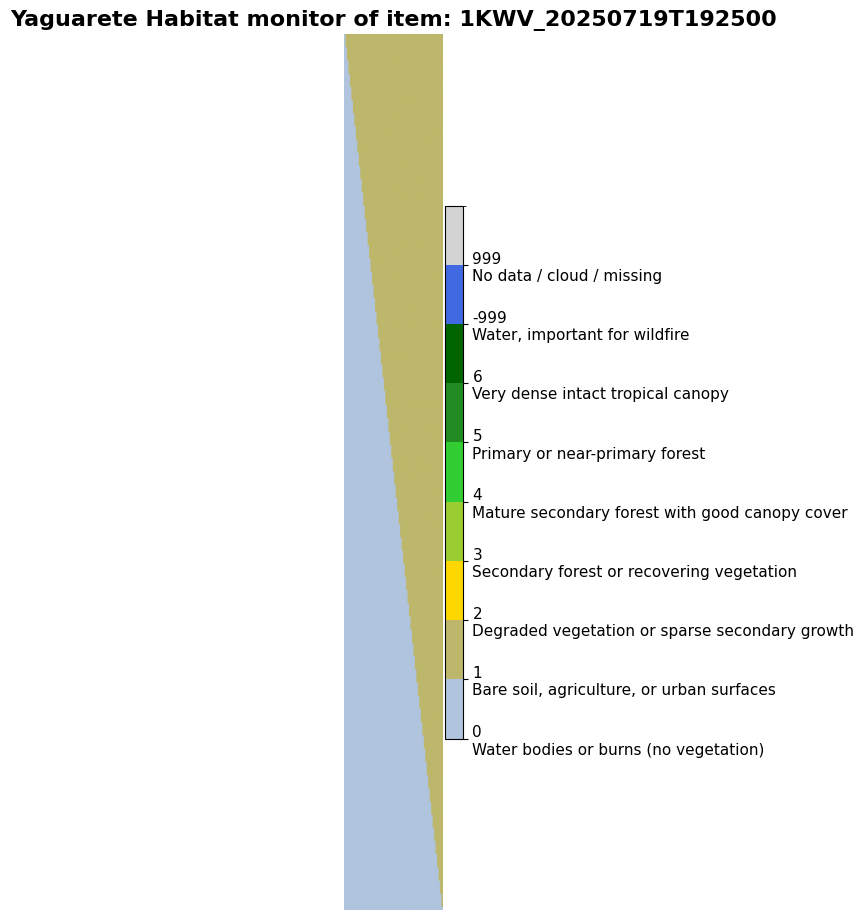

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [164]:
all_habitat_colors = [member.color for member in NDVIHabitatClass]
cmap = ListedColormap(all_habitat_colors)

bounds = list(range(len(NDVIHabitatClass))) + [len(NDVIHabitatClass)]
norm = BoundaryNorm(bounds, cmap.N)

fig, ax = plt.subplots(figsize=(5, 10))
im = ax.imshow(habitat_computed_data, cmap=cmap, norm=norm)
ax.set_title(f'Yaguarete Habitat monitor of item: {sample_ndvi_stats["item_id_short"]}', fontweight="bold", fontsize=16)
ax.axis("off")

cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.02, aspect=30)
cbar.ax.tick_params(labelsize=11)
labels = [f"{c.value}\n{c.description}" for c in NDVIHabitatClass]
cbar.set_ticks(range(len(NDVIHabitatClass)))
cbar.set_ticklabels(labels, ha="left", rotation=0)

plt.tight_layout()
plt.savefig(f'./img/{sample_ndvi_stats["item_id_short"]}_habitat_monitor_plot.png', dpi=300, bbox_inches="tight")
plt.show()

raster_info = raster_bounds_and_centroid(sample_ndvi_habitat_masked)


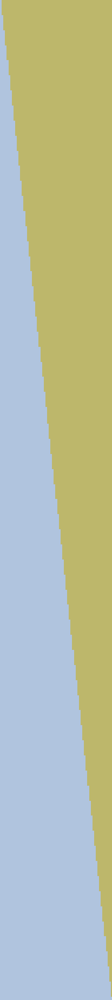

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [165]:
fig, ax = plt.subplots(figsize=(12, 8))
ax.imshow(habitat_computed_data, cmap=cmap, norm=norm)
ax.axis('off')
plt.savefig('habitat.png', dpi=300, bbox_inches='tight', pad_inches=0)
plt.close()

raster_info = raster_bounds_and_centroid(sample_ndvi_habitat_masked)

m = utils.reset_panthera_onca_map(
    panthera_onca_gdf_simple,
    opacity=0.1,
    explore_kwargs={
        "location": (raster_info['centroid_lat'], raster_info['centroid_lon']),
        "zoom_start": 7,
        "tiles": "https://tile-a.openstreetmap.fr/hot/{z}/{x}/{y}.png",
        "attr": "© OpenStreetMap contributors, tiles courtesy of Humanitarian OpenStreetMap Team"
    }
)

folium.raster_layers.ImageOverlay(
    image='habitat.png',
    bounds=raster_info['bounds'],
    opacity=0.8
).add_to(m)

m

![](img/early_item_clipped_ndvi.png)
> *map output redundancy in case is not being showed/rendered correctly*

✍🏽 The gray pixels for this specific item is a result of applying `clip` at pixel level against the wildfire geometry

In [166]:
item_sample

gsd                                                                                   10.0
created                                                          2025-07-19 19:25:00+00:00
mission                                                                         copernicus
sci:doi                                                                10.5270/S2_-znk9xsj
updated                                                          2025-07-19 19:25:00+00:00
datetime_utc                                              2025-07-19 13:57:09.024000+00:00
platform                                                                       sentinel-2b
grid:code                                                                       MGRS-21KWV
proj:bbox                                [-57.00019011602501, -19.080909964696847, -55....
proj:code                                                                       EPSG:32721
providers                                [{'url': 'https://commission.europa.eu/', 'nam...

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## NDVI pipeline for sample items

The NDVI processing pipeline is applied to the items stored in
`sample_items_gdf`.

Unlike the earlier exploratory step using a single STAC item,
this stage iterates directly over the dataframe rows returned
by the catalog query.

Each row already contains the relevant EOPF Zarr asset URLs,
including the reflectance bands and Scene Classification Layer.

The workflow for each item is:

1. open the Sentinel-2 Zarr product
2. extract the B04 (red) and B08 (NIR) reflectance bands
3. apply the EOPF reflectance scaling
4. compute NDVI
5. apply the SCL quality mask
6. clip the raster to the Panthera onca corridor
7. compute NDVI statistics

The resulting statistics are stored in a list and converted
to a dataframe for further analysis.

In [167]:
def from_item_to_habitat_enum(item: pd.Series) -> pd.Series:
    """
    Derive a habitat classification enum from a satellite scene item using NDVI.
    (docstring unchanged)
    """

    item = item.copy()

    try:
        open_kwargs = utils._build_open_kwargs_dtree_dict(item=item)
        dt = xr.open_datatree(item["zarr_url"], **open_kwargs)

        red_band = dt["/measurements/reflectance/r10m"].to_dataset()["b04"]
        red_band = _set_missing_crs(red_band)

        nir_band = dt["/measurements/reflectance/r10m"].to_dataset()["b08"]
        nir_band = _set_missing_crs(nir_band)

        red_band_boa_reflectance = _apply_eopf_array_boa_reflectance(
            da_to_add_boa_reflectance=red_band
        )

        nir_band_boa_reflectance = _apply_eopf_array_boa_reflectance(
            da_to_add_boa_reflectance=nir_band
        )

        ndvi_array = _compute_ndvi_array(
            red_b04=red_band_boa_reflectance,
            nir_b08=nir_band_boa_reflectance
        )

        scl_array_20m = dt["/conditions/mask/l2a_classification/r20m"].to_dataset()["scl"]

        scl_array_20m = scl_array_20m.rio.write_crs(CRS_FROM_METADATA, inplace=False)

        scl_array_10m = scl_array_20m.rio.reproject_match(
            red_band_boa_reflectance,
            resampling=Resampling.nearest
        )

        masked_ndvi_array_10m = _apply_mask_ndvi_by_scl(
            ndvi_array=ndvi_array,
            scl_array_20m=scl_array_10m,
            scl_valid_ints=NDVI_SCL_VALID_CLASSES
        )

        # clipped_masked_ndvi_array_10m = _clip_to_corridor(
        #    ndvi_array_10m=masked_ndvi_array_10m
        # )
        # TODO: review clip bug (inverse?)

        ndvi_stats = _compute_ndvi_and_its_statistics(
            clipped_ndvi_array_10m=masked_ndvi_array_10m,
            item_id=item["id"]
        )

        ndvi_mean = ndvi_stats["ndvi_mean"]
        habitat_enum = NDVIHabitatClass.from_ndvi(ndvi_mean)

        item["ndvi_mean"] = ndvi_mean
        item["habitat_enum"] = habitat_enum

        for k, v in ndvi_stats.items():
            item[k] = v

        item["error"] = None

    except Exception as e:
        item["ndvi_mean"] = np.nan
        item["habitat_enum"] = np.nan
        item["error"] = str(e)

    return item

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [168]:
sample_items_gdf

,gsd,created,mission,sci:doi,updated,datetime_utc,platform,grid:code,proj:bbox,proj:code,...,zarr_url,B03_20m,B04_20m,B08_20m,QA60,SCL_20m,datetime_utc_naive,month,eo:cloud_cover_pct_label,geometry
89,10.0,2025-07-19 19:25:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-07-19 19:25:00+00:00,2025-07-19 13:57:09.024000+00:00,sentinel-2b,MGRS-21KWV,"[-57.00019011602501, -19.080909964696847, -55....",EPSG:32721,...,https://objects.eodc.eu:443/e05ab01a9d56408d82...,None,None,None,None,https://objects.eodc.eu:443/e05ab01a9d56408d82...,2025-07-19 13:57:09.024,2025-07,35.0-64.0%,"POLYGON ((-55.96254 -18.08574, -57.00019 -19.0..."
296,10.0,2025-05-19 23:15:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-05-19 23:15:00+00:00,2025-05-19 16:38:51.025000+00:00,sentinel-2c,MGRS-15QVV,"[-93.94542686718289, 17.09440548579995, -92.92...",EPSG:32615,...,https://objectstore.eodc.eu:2222/e05ab01a9d564...,None,None,None,None,https://objectstore.eodc.eu:2222/e05ab01a9d564...,2025-05-19 16:38:51.025,2025-05,<35.0% (light),"POLYGON ((-93.94543 18.08675, -93.17279 17.096..."
297,10.0,2025-05-19 23:15:00+00:00,copernicus,10.5270/S2_-znk9xsj,2025-05-19 23:15:00+00:00,2025-05-19 16:38:51.025000+00:00,sentinel-2c,MGRS-15QUV,"[-94.88981453576909, 17.08787135017584, -93.84...",EPSG:32615,...,https://objectstore.eodc.eu:2222/e05ab01a9d564...,None,None,None,None,https://objectstore.eodc.eu:2222/e05ab01a9d564...,2025-05-19 16:38:51.025,2025-05,<35.0% (light),"POLYGON ((-94.87953 17.08787, -93.85244 18.087..."


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [169]:
sample_results_gdf = sample_items_gdf.apply(
    from_item_to_habitat_enum,
    axis=1
)

/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [170]:
sample_results_gdf["error"]

89     None
296    None
297    None
Name: error, dtype: object

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [171]:
sample_results_gdf["habitat_color"] = sample_results_gdf["habitat_enum"].apply(
    lambda x: x.color if isinstance(x, IntEnum) else NDVIHabitatClass.NO_DATA.color
)

m = utils.reset_panthera_onca_map(panthera_onca_gdf_simple=panthera_onca_gdf_simple, opacity=0.4)

sample_results_gdf[["id", "geometry", "collection_id", "habitat_enum", "habitat_color"]].explore(
    m=m,
    color=sample_results_gdf["habitat_color"],
    categorical=True,
    legend=False,
    style_kwds={"fillOpacity": 0.9, "weight": 1}
)

legend = f"""
{custom_head_legend_html}
<span style="color:lightgray; font-weight:bold;">●</span> Bare / Non-vegetated<br>
<span style="color:yellowgreen; font-weight:bold;">●</span> Sparse vegetation<br>
<span style="color:forestgreen; font-weight:bold;">●</span> Moderate vegetation<br>
<span style="color:darkgreen; font-weight:bold;">●</span> Dense vegetation<br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend))
m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [172]:
random_sample_items_gdf = items_features_oi_gdf.sample(n=10, random_state=42)

random_sample_results_gdf = random_sample_items_gdf.apply(
    from_item_to_habitat_enum,
    axis=1
)

random_sample_results_gdf.to_file("habitat_results_random_sample_items_gdf_items.geojson", driver="GeoJSON")

/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/home/bibo/anaconda3/envs/yaguarete/lib/python3.12/site-packages/dask/array/numpy_compat.py:61: RuntimeWarning: inv

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [173]:
# TODO: evaluate applying median for quick look instead of mean

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [174]:
random_sample_results_gdf["habitat_color"] = random_sample_results_gdf["habitat_enum"].apply(
    lambda x: x.color if isinstance(x, IntEnum) else NDVIHabitatClass.NO_DATA.color
)

m = utils.reset_panthera_onca_map(panthera_onca_gdf_simple=panthera_onca_gdf_simple, opacity=0.4)

random_sample_results_gdf[["id", "geometry", "collection_id", "habitat_enum", "habitat_color"]].explore(
    m=m,
    color=sample_results_gdf["habitat_color"],
    categorical=True,
    legend=False,
    style_kwds={"fillOpacity": 0.7, "weight": 1}
)

legend = f"""
{custom_head_legend_html}
<span style="color:lightgray; font-weight:bold;">●</span> Bare / Non-vegetated<br>
<span style="color:yellowgreen; font-weight:bold;">●</span> Sparse vegetation<br>
<span style="color:forestgreen; font-weight:bold;">●</span> Moderate vegetation<br>
<span style="color:darkgreen; font-weight:bold;">●</span> Dense vegetation<br>
</div>
"""

m.get_root().html.add_child(folium.Element(legend))
m

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [175]:
# TODO: fix clip
# TODO: Improve pipline efficienct with dak and arallelism
# TODO: Plot monthly
# TODO: detect water
# TODO: correlate with https://www.gbif.org/occurrence/search?country=AR&has_coordinate=true&has_geospatial_issue=false&taxon_key=5219426&year=1000,2026 (thanks to Sabrina <3)

# TODO: part 3, vis ndvi + water monthly + correlated with yaguarete ocurrence intersects scenes

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>